# Build a time-seried forecasting model and make it more practical by using BigQuery ML
### by JeongMin Kwon (cojette@gmail.com)

This notebook shows you how to train, deploy, evaluate a time series model, and some application for time-series forecasting by using BigQuery ML. 
Using the public [Iowa Liquor Sales data](https://console.cloud.google.com/marketplace/details/obfuscated-ga360-data/obfuscated-ga360-data?filter=solution-type:dataset) dataset, you use a single SQL query to create multiple time series models, where each model forecasts the retail sales of a single liquor product. 

By the end of this notebook, you will know how to:
* Pre-process time series data into the correct format needed to create the model.
* Train the time series model in BigQuery ML.
* Evaluate the model.
* Make predictions about future demand using the model.
* Find a trend, seasonality, holidy effects of each time-series data
* Check stationary and autocorrelation, as a basic characteristics of time-series data
* Check causal inferences of a point with decomposed time-series data. 

## Setup

Install the required packages, configure the environment variables, and create a BigQuery dataset.

### PIP Install Packages and dependencies

In [2]:
!pip install google-cloud-bigquery google-cloud-bigquery-storage --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 4.3 MB/s eta 0:00:00a 0:00:01
  Attempting uninstall: google-cloud-bigquery
    Found existing installation: google-cloud-bigquery 2.34.4
    Uninstalling google-cloud-bigquery-2.34.4:
      Successfully uninstalled google-cloud-bigquery-2.34.4
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-cloud-aiplatform 1.18.2 requires google-cloud-bigquery<3.0.0dev,>=1.15.0, but you have google-cloud-bigquery 3.4.0 which is incompatible.


In [1]:
# Automatically restart kernel after installs ## able to skip
import IPython
app = IPython.Application.instance()
app.kernel.do_shutdown(True)  

{'status': 'ok', 'restart': True}

### Configure GCP environment settings

Update the following variables to reflect the values for your GCP environment:

* PROJECT_ID: The ID of the Google Cloud project you are using to implement this solution.
* REGION: The region to use for the BigQuery dataset.

In [1]:

PROJECT_ID = 'bqmltest' # Change to your project.
REGION = '' # if necessary

### Import libraries and define constants

In [10]:
from google.cloud import bigquery
import pandas as pd
from datetime import datetime, timedelta

pd.set_option('display.float_format', lambda x: '%.3f' % x)

### Function for data manipulation and plotting

In [2]:
import matplotlib.pyplot as plt
import pandas as pd

def plot_historical_and_forecast(input_timeseries, 
                                 timestamp_col_name, 
                                 data_col_name, 
                                 forecast_output=None, 
                                 actual=None, 
                                 title=None,
                                 plotstartdate=None):

    if plotstartdate:
        input_timeseries = input_timeseries[pd.to_datetime(input_timeseries[timestamp_col_name]) >= pd.to_datetime(plotstartdate)]
    input_timeseries = input_timeseries.sort_values(timestamp_col_name)    
    
    # Plot the input historical data
    plt.figure(figsize=(20,6))
    plt.plot(input_timeseries[timestamp_col_name], input_timeseries[data_col_name], label = 'Historical')
    plt.xlabel(timestamp_col_name)
    plt.ylabel(data_col_name)

    if forecast_output is not None:
        forecast_output = forecast_output.sort_values('forecast_timestamp')
        forecast_output['forecast_timestamp'] = pd.to_datetime(forecast_output['forecast_timestamp'])
        x_data = forecast_output['forecast_timestamp']
        y_data = forecast_output['forecast_value']
        confidence_level = forecast_output['confidence_level'].iloc[0] * 100
        low_CI = forecast_output['confidence_interval_lower_bound']
        upper_CI = forecast_output['confidence_interval_upper_bound']
        # Plot the forecast data
        plt.plot(x_data, y_data, alpha = 1, label = 'Forecast', linestyle='--')
        # Shade the confidence interval
        plt.fill_between(x_data, low_CI, upper_CI, color = '#539caf', alpha = 0.4, 
                         label = f'{confidence_level} confidence interval')

    # Plot actual data
    if actual is not None:
        #actual = actual.sort_values(timestamp_col_name)
        actual = actual.sort_values('date')
        #plt.plot(actual[timestamp_col_name], actual[data_col_name], label = 'Actual', linestyle='--')   
        plt.plot(actual['date'], actual["total_amount_sold"], label = 'Actual', linestyle='--')   

    # Display title, legend
    plt.title(f'{title}', fontsize= 16)
    plt.legend(loc = 'upper center', prop={'size': 16})

### Create a BigQuery dataset

Create a dataset in your project called `bqmltest`:

In [12]:
!bq mk --location=$REGION --dataset $PROJECT_ID:bqmltest

BigQuery error in mk operation: Access Denied: Project bqmltest: User does not
have bigquery.datasets.create permission in project bqmltest.


## Prepare the training data

You train the time series models on a dataset containing transactional data. Each row represents a transaction on a single product, as identified by the `item_description` value, and contains details such as the number of bottles sold and the sales amount in dollars. In following steps, you use the number of bottles sold value to forecast product demand.

_Note_: Jupyter runs cells starting with %%bigquery as SQL queries

In [73]:
!pip3 install google-cloud
!pip3 install google-oauth

import glob
from google.cloud import bigquery
from google.oauth2 import service_account


credential = service_account.Credentials.from_service_account_file("bqmltest-422606-67ec55acac6c.json")


# GCP 클라이언트 객체 생성
client = bigquery.Client(credentials = credential,
                         project = credential.project_id)




In [13]:
## load data to dataframe
sql = """
        SELECT 
            invoice_and_item_number,
            date,
            store_number,
            item_description,
            bottles_sold,
            sale_dollars
        FROM
          `bigquery-public-data.iowa_liquor_sales.sales` 
        LIMIT 
          20
    """

query_job = client.query(sql)

df = query_job.to_dataframe()
df



,invoice_and_item_number,date,store_number,item_description,bottles_sold,sale_dollars
0,INV-62755800099,2023-09-28,6129,JAGERMEISTER LIQUEUR MINI MEISTERS,1,8.450
1,INV-55032200016,2023-01-17,6231,JAGERMEISTER LIQUEUR MINI MEISTERS,1,8.450
2,INV-67927000017,2024-03-05,5866,JAGERMEISTER LIQUEUR MINI MEISTERS,1,8.450
3,INV-32432100011,2020-12-04,5821,JAGERMEISTER LIQUEUR MINI MEISTERS,1,7.400
4,INV-61865000058,2023-09-01,5327,JAGERMEISTER LIQUEUR MINI MEISTERS,1,8.450
5,INV-40208700003,2021-09-17,5966,JAGERMEISTER LIQUEUR MINI MEISTERS,1,7.400
6,INV-51969200007,2022-10-10,5956,FIREBALL CINNAMON WHISKEY PARTY BUCKET,1,77.400
7,INV-58738600001,2023-05-23,5649,FIREBALL CINNAMON WHISKEY PARTY BUCKET,1,77.400
8,INV-51175800038,2022-09-13,3723,FIREBALL CINNAMON WHISKEY PARTY BUCKET,1,77.400
9,INV-31413600047,2020-10-27,3932,FIREBALL CINNAMON WHISKEY PARTY BUCKET,1,90.000


In [8]:
%%bigquery --project $PROJECT_ID

#data check 
SELECT COUNT(1), max(date) as max_date, min(date) as min_date
FROM `bigquery-public-data.iowa_liquor_sales.sales` 

Query is running:   0%|          |

Downloading:   0%|          |

,f0_,max_date,min_date
0,25060495,2022-10-31,2012-01-03


You can adjust the `TRAININGDATA_STARTDATE` and `TRAININGDATA_ENDDATE` parameters to specify the start/end dates of your training data:

### Write the training data to a table

If you review the training data, you can observe that some days have no transactions for a given product. To keep you from having to do additional pre-processing, BigQuery ML automatically handles the following situations:

* Missing values: Values are imputed using local [linear interpolation](https://en.wikipedia.org/wiki/Linear_interpolation).
* Duplicated timestamps: Values are averaged across duplicated timestamps.
* Spike and dip anomalies: Values are standardized using local [z-scores](https://en.wikipedia.org/wiki/Standard_score).

In [22]:
## training date: '2016-01-01' to '2019-06-01'

sql = """
        CREATE OR REPLACE TABLE bqmlforecast.training_data AS (
            WITH topsellingitems AS(
                 SELECT 
                    item_description,
                    count(item_description) cnt_transactions
                FROM
                    `bigquery-public-data.iowa_liquor_sales.sales` 
                GROUP BY 
                    item_description
                ORDER BY cnt_transactions DESC
                LIMIT 7 #Top N
            )
            SELECT 
                date,
                item_description AS item_name,
                SUM(bottles_sold) AS total_amount_sold
            FROM
                `bigquery-public-data.iowa_liquor_sales.sales` 
            GROUP BY
                date, item_name
            HAVING 
                date BETWEEN '2016-01-01' AND '2019-06-01' 
                AND item_description IN (SELECT item_description FROM topsellingitems)
            );

        SELECT 
            date,
            item_name,
            total_amount_sold
        FROM 
            bqmlforecast.training_data 
        ORDER BY item_name, date
        LIMIT 10
"""

query_job = client.query(sql)
query_job

QueryJob<project=bqmltest-422606, location=US, id=1912a666-bc5c-4747-bdf8-8e187bea0b98>

### Plot the sales histories of the target liquor products

Save the training data to the `dfhistorical` Pandas dataframe:

In [23]:

sql = """
        SELECT 
            * 
        FROM 
            bqmlforecast.training_data
    """
query_job = client.query(sql)

dfhistorical = query_job.to_dataframe()
dfhistorical.head()


,date,item_name,total_amount_sold
0,2016-09-13,JIM BEAM,661
1,2018-02-19,JIM BEAM,921
2,2016-07-07,JIM BEAM,580
3,2016-08-09,JIM BEAM,751
4,2018-10-02,JIM BEAM,984


Using the training data, plot the sales histories of the target liquor products:

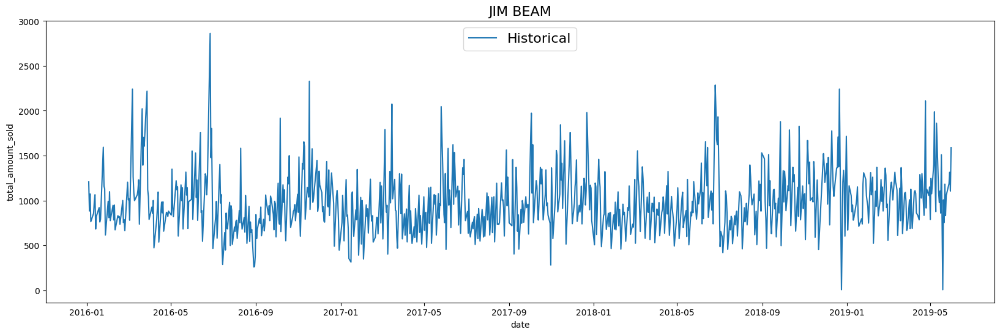

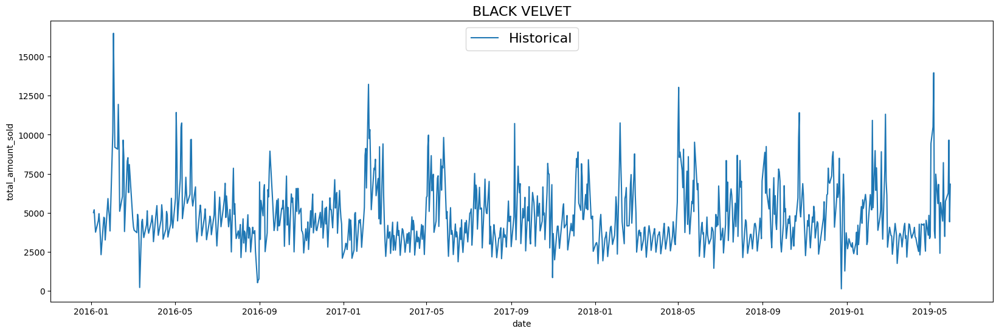

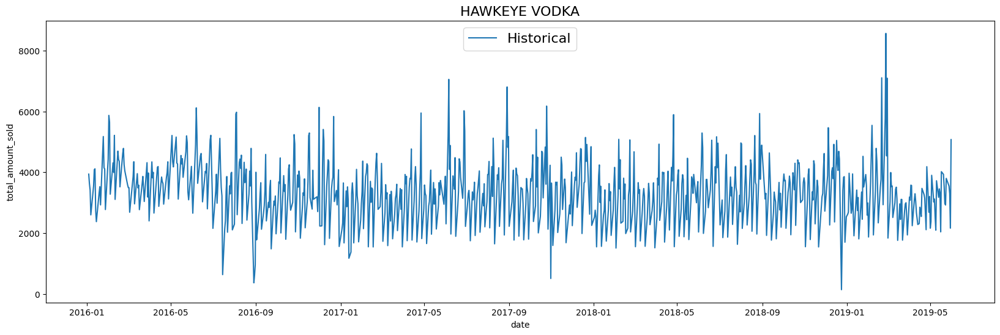

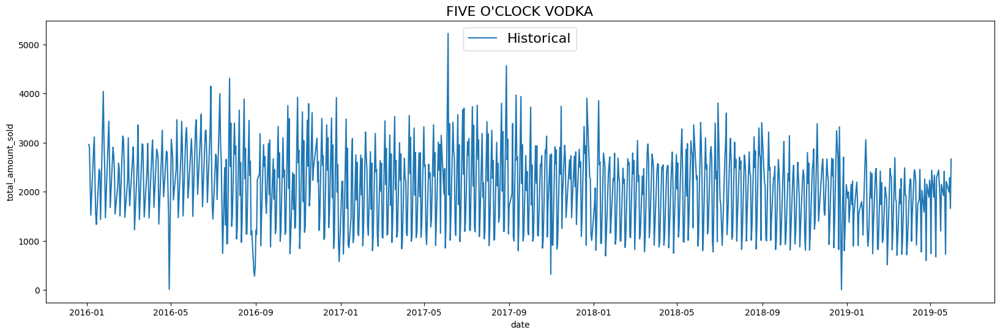

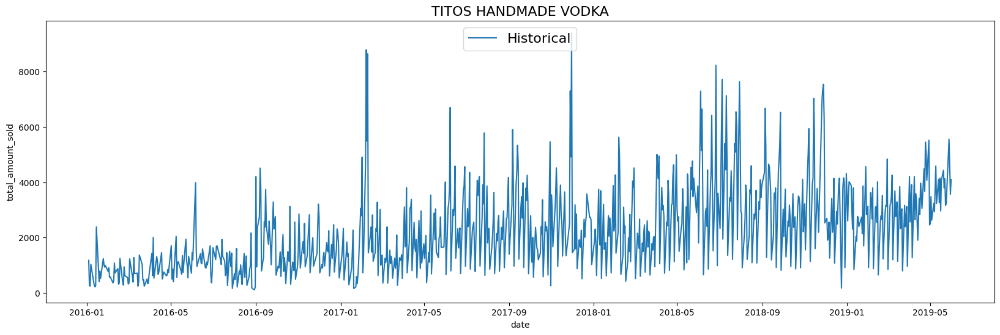

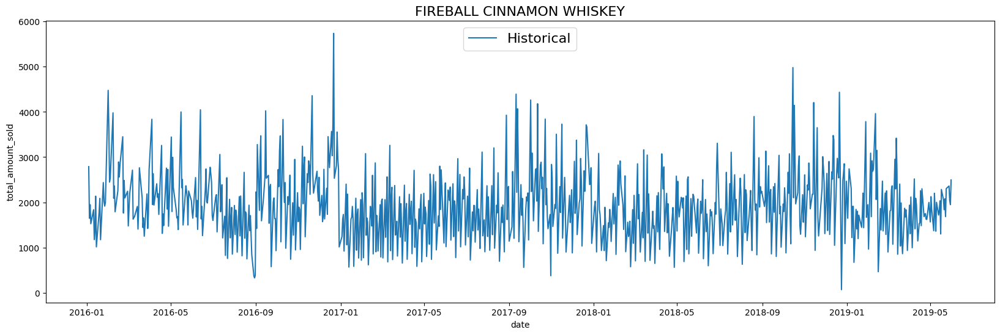

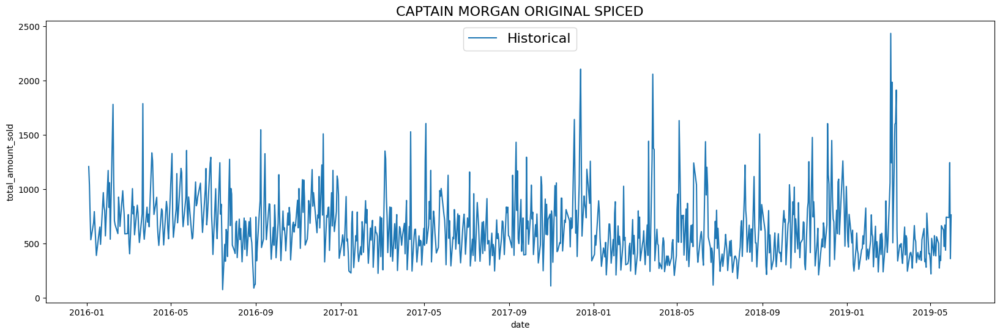

In [24]:
itemslist = list(dfhistorical.item_name.unique())

for item in itemslist:
    
    datah = dfhistorical[dfhistorical.item_name==item]
    plot_historical_and_forecast(input_timeseries = datah, 
                                 timestamp_col_name = "date", 
                                 data_col_name = "total_amount_sold", 
                                 forecast_output = None, 
                                 actual = None,
                                 title = item)

## Train the model

Because you are training the model on multiple products in a single model creation statement, you must specify the `item_name` column for the [TIME_SERIES_ID_COL](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-create-time-series#time_series_id_col) parameter. If you were only forecasting a single item, then you would not need to specify `TIME_SERIES_ID_COL`. For more information, see the [BigQuery ML time series model creation documentation](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-create-time-series#create_model_syntax).

You can also account for holiday effects when doing time series modeling in BigQuery ML. By default, holiday effects modeling is disabled. But since this data is from the United States, and the data includes a minimum one year of daily data, you can also specify an optional `HOLIDAY_REGION`. With holiday effects enabled, spikes and dips that appear during holidays will no longer be treated as anomalies. A full list of the holiday regions can be found in the [HOLIDAY_REGION documentation](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-create-time-series#holiday_region).



In [25]:
## Just for compare

sql = """
    CREATE OR REPLACE MODEL bqmlforecast.arima_model

    OPTIONS(
      MODEL_TYPE='ARIMA',
      TIME_SERIES_TIMESTAMP_COL='date', 
      TIME_SERIES_DATA_COL='total_amount_sold',
      TIME_SERIES_ID_COL='item_name',
      HOLIDAY_REGION='US'
    ) AS

    SELECT 
        date,
        item_name,
        total_amount_sold
    FROM
      bqmlforecast.training_data
  """

query_job = client.query(sql)
query_job

QueryJob<project=bqmltest-422606, location=US, id=ce068e0d-5208-43aa-b241-87329612309b>

In [26]:
sql = """
        CREATE OR REPLACE MODEL bqmlforecast.arima_plus_model

        OPTIONS(
          MODEL_TYPE='ARIMA_PLUS',
          TIME_SERIES_TIMESTAMP_COL='date', 
          TIME_SERIES_DATA_COL='total_amount_sold',
          TIME_SERIES_ID_COL='item_name',
          HOLIDAY_REGION='US', 
          DECOMPOSE_TIME_SERIES = TRUE,
          CLEAN_SPIKES_AND_DIPS = TRUE, 
          TREND_SMOOTHING_WINDOW_SIZE = 7
        ) AS

        SELECT 
            date,
            item_name,
            total_amount_sold
        FROM
          bqmlforecast.training_data
          
  """

query_job = client.query(sql)
query_job

QueryJob<project=bqmltest-422606, location=US, id=9623a80e-9c2a-4768-973b-7e59d233fbbb>

### Evaluate the model

Use the [ML.EVALUATE](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-evaluate) function to see the evaluation metrics of all the created models. 

The `non_seasonal_`{`p`,`d`,`q`} and `has_drift` columns define the time series model. The `log_likelihood`, `AIC`, and `variance` columns are relevant to the model fitting process. The fitting process determines the best model by using the [auto.ARIMA algorithm](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-create-time-series#auto_arima), one for each time series.

In [28]:

sql = """
        SELECT
          *
        FROM
          ML.EVALUATE(MODEL bqmlforecast.arima_model)
      """

query_job = client.query(sql)
df = query_job.to_dataframe()
df.head()

,item_name,non_seasonal_p,non_seasonal_d,non_seasonal_q,has_drift,log_likelihood,AIC,variance,seasonal_periods
0,BLACK VELVET,2,1,3,False,-9822.019,19656.038,426684.246,"[WEEKLY, YEARLY]"
1,CAPTAIN MORGAN ORIGINAL SPICED,2,1,2,True,-7748.960,15509.920,15187.612,"[WEEKLY, YEARLY]"
2,FIREBALL CINNAMON WHISKEY,0,1,5,False,-8893.247,17798.494,95359.870,"[WEEKLY, YEARLY]"
3,FIVE O'CLOCK VODKA,0,1,5,False,-8606.587,17225.173,60202.108,"[WEEKLY, YEARLY]"
4,HAWKEYE VODKA,0,1,5,False,-9032.147,18076.293,119513.246,"[WEEKLY, YEARLY]"


In [29]:
sql = """
        SELECT
          *
        FROM
          ML.ARIMA_EVALUATE(MODEL bqmlforecast.arima_plus_model)
        """

query_job = client.query(sql)
df = query_job.to_dataframe()
df.head()

,item_name,non_seasonal_p,non_seasonal_d,non_seasonal_q,has_drift,log_likelihood,AIC,variance,seasonal_periods,has_holiday_effect,has_spikes_and_dips,has_step_changes,error_message
0,BLACK VELVET,2,1,3,False,-9822.019,19656.038,426684.246,"[WEEKLY, YEARLY]",True,True,False,
1,CAPTAIN MORGAN ORIGINAL SPICED,2,1,2,True,-7748.960,15509.920,15187.612,"[WEEKLY, YEARLY]",True,True,True,
2,FIREBALL CINNAMON WHISKEY,0,1,5,False,-8893.247,17798.494,95359.870,"[WEEKLY, YEARLY]",True,False,True,
3,FIVE O'CLOCK VODKA,0,1,5,False,-8606.587,17225.173,60202.108,"[WEEKLY, YEARLY]",True,False,True,
4,HAWKEYE VODKA,0,1,5,False,-9032.147,18076.293,119513.246,"[WEEKLY, YEARLY]",True,True,True,


You can see that five models were trained, one for each of the products in the `item_name` column. Each model has its own `p,d,q` hyperparameters, and the detected seasonality for these five models is `WEEKLY`.

## Make predictions using the model

Make predictions using [ML.FORECAST](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-forecast), which forecasts the next _n_ values, as specified in the `horizon` parameter. You can also optionally change the `confidence_level` parameter to change the percentage of future values that fall in the prediction interval. You save the prediction data to the `dfforecast` dataframe so that you can plot it in a following step.


In [36]:
## Just for comparing to the old version

sql = """

    SELECT
      *
    FROM 
      ML.FORECAST(MODEL bqmlforecast.arima_model, 
                  STRUCT(30 AS horizon, 
                         0.90 AS confidence_level)
                 )    
    """
query_job = client.query(sql)
dfforecast = query_job.to_dataframe()
dfforecast.head()

,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound
0,BLACK VELVET,2019-06-01 00:00:00+00:00,3200.405,653.211,0.900,2127.133,4273.676,2127.133,4273.676
1,BLACK VELVET,2019-06-02 00:00:00+00:00,3663.756,744.991,0.900,2439.683,4887.830,2439.683,4887.830
2,BLACK VELVET,2019-06-03 00:00:00+00:00,3441.217,792.050,0.900,2139.823,4742.612,2139.823,4742.612
3,BLACK VELVET,2019-06-04 00:00:00+00:00,6211.185,805.104,0.900,4888.342,7534.027,4888.342,7534.027
4,BLACK VELVET,2019-06-05 00:00:00+00:00,3703.911,815.283,0.900,2364.342,5043.479,2364.342,5043.479


In [37]:
dfforecast.tail()

,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound
205,TITOS HANDMADE VODKA,2019-06-26 00:00:00+00:00,4358.966,688.155,0.900,3228.278,5489.654,3228.278,5489.654
206,TITOS HANDMADE VODKA,2019-06-27 00:00:00+00:00,3744.170,688.906,0.900,2612.248,4876.092,2612.248,4876.092
207,TITOS HANDMADE VODKA,2019-06-28 00:00:00+00:00,2635.472,689.656,0.900,1502.318,3768.627,1502.318,3768.627
208,TITOS HANDMADE VODKA,2019-06-29 00:00:00+00:00,4760.975,690.406,0.900,3626.590,5895.361,3626.590,5895.361
209,TITOS HANDMADE VODKA,2019-06-30 00:00:00+00:00,4335.063,691.154,0.900,3199.448,5470.679,3199.448,5470.679


In [40]:
sql = """
    SELECT
      *
    FROM 
      ML.FORECAST(MODEL bqmlforecast.arima_plus_model, 
                  STRUCT(100 AS horizon, 
                         0.90 AS confidence_level)
                 )

                             """
query_job = client.query(sql)
dfforecast_plus = query_job.to_dataframe()
dfforecast_plus.head()


,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound
0,BLACK VELVET,2019-06-01 00:00:00+00:00,3200.405,653.211,0.900,2127.133,4273.676,2127.133,4273.676
1,BLACK VELVET,2019-06-02 00:00:00+00:00,3663.756,744.991,0.900,2439.683,4887.830,2439.683,4887.830
2,BLACK VELVET,2019-06-03 00:00:00+00:00,3441.217,792.050,0.900,2139.823,4742.612,2139.823,4742.612
3,BLACK VELVET,2019-06-04 00:00:00+00:00,6211.185,805.104,0.900,4888.342,7534.027,4888.342,7534.027
4,BLACK VELVET,2019-06-05 00:00:00+00:00,3703.911,815.283,0.900,2364.342,5043.479,2364.342,5043.479


In [41]:
dfforecast_plus.tail()

,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound
695,TITOS HANDMADE VODKA,2019-09-04 00:00:00+00:00,4593.979,738.881,0.900,3379.945,5808.013,3379.945,5808.013
696,TITOS HANDMADE VODKA,2019-09-05 00:00:00+00:00,5009.843,739.580,0.900,3794.659,6225.026,3794.659,6225.026
697,TITOS HANDMADE VODKA,2019-09-06 00:00:00+00:00,4839.213,740.279,0.900,3622.881,6055.544,3622.881,6055.544
698,TITOS HANDMADE VODKA,2019-09-07 00:00:00+00:00,4153.441,740.977,0.900,2935.963,5370.920,2935.963,5370.920
699,TITOS HANDMADE VODKA,2019-09-08 00:00:00+00:00,4357.762,741.675,0.900,3139.138,5576.387,3139.138,5576.387


In [42]:
print(f"Number of rows: {dfforecast_plus.shape[0]}") #horizon * number of liquors (7)

Number of rows: 700


In [43]:
# for comparing old ARIMA and ARIMA+
comp = pd.concat([dfforecast, dfforecast_plus]).drop_duplicates(keep=False)
comp

,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound
30,BLACK VELVET,2019-07-01 00:00:00+00:00,4092.187,827.373,0.900,2732.754,5451.620,2732.754,5451.620
31,BLACK VELVET,2019-07-02 00:00:00+00:00,5761.046,827.506,0.900,4401.394,7120.698,4401.394,7120.698
32,BLACK VELVET,2019-07-03 00:00:00+00:00,2590.881,827.742,0.900,1230.842,3950.921,1230.842,3950.921
33,BLACK VELVET,2019-07-04 00:00:00+00:00,1458.480,827.882,0.900,98.212,2818.749,98.212,2818.749
34,BLACK VELVET,2019-07-05 00:00:00+00:00,4700.795,828.110,0.900,3340.152,6061.439,3340.152,6061.439
...,...,...,...,...,...,...,...,...,...
695,TITOS HANDMADE VODKA,2019-09-04 00:00:00+00:00,4593.979,738.881,0.900,3379.945,5808.013,3379.945,5808.013
696,TITOS HANDMADE VODKA,2019-09-05 00:00:00+00:00,5009.843,739.580,0.900,3794.659,6225.026,3794.659,6225.026
697,TITOS HANDMADE VODKA,2019-09-06 00:00:00+00:00,4839.213,740.279,0.900,3622.881,6055.544,3622.881,6055.544
698,TITOS HANDMADE VODKA,2019-09-07 00:00:00+00:00,4153.441,740.977,0.900,2935.963,5370.920,2935.963,5370.920


#### Inspect the model coefficients

You can view the coefficients of each of the time series models using [ML.ARIMA_COEFFICIENTS](https://cloud.google.com/bigquery-ml/docs/reference/standard-sql/bigqueryml-syntax-arima-coefficients).

For each of the models, the `ar_coefficients` value shows the model coefficients of the autoregressive (AR) part of the time series model. Similarly, the `ma_coefficients` value shows the model coefficients of the moving-average (MA) part of the model. Both of these values are arrays, and their lengths are equal to `non_seasonal_p` and `non_seasonal_q`, respectively. The `intercept_or_drift` value is the constant term in the time series model.

In [44]:
sql = """
SELECT
  *
FROM 
  ML.ARIMA_COEFFICIENTS(MODEL bqmlforecast.arima_plus_model)
          """

query_job = client.query(sql)
df = query_job.to_dataframe()
df.head()

,item_name,ar_coefficients,ma_coefficients,intercept_or_drift
0,BLACK VELVET,"[-0.295088548812585, 0.5904014652522802]","[-0.15649958984054124, -0.8603441994061664, 0....",0.000
1,CAPTAIN MORGAN ORIGINAL SPICED,"[-0.2705990343720204, 0.561418444481632]","[-0.17387972773355484, -0.8069021822684639]",-0.197
2,FIREBALL CINNAMON WHISKEY,[],"[-0.49849626572014477, -0.631374944643742, 0.6...",0.000
3,FIVE O'CLOCK VODKA,[],"[-0.5798035032528138, 0.1499980290537013, -0.6...",0.000
4,HAWKEYE VODKA,[],"[-0.44884544905750223, 0.07745004114931069, -0...",0.000


#### Plot the forecasted predictions against the historical data

Plot the forecasted predictions, using the `dfhistorical` dataframe that contains the historical data that you used for training and the `dfforecast_plus` dataframe that contains the prediction data:

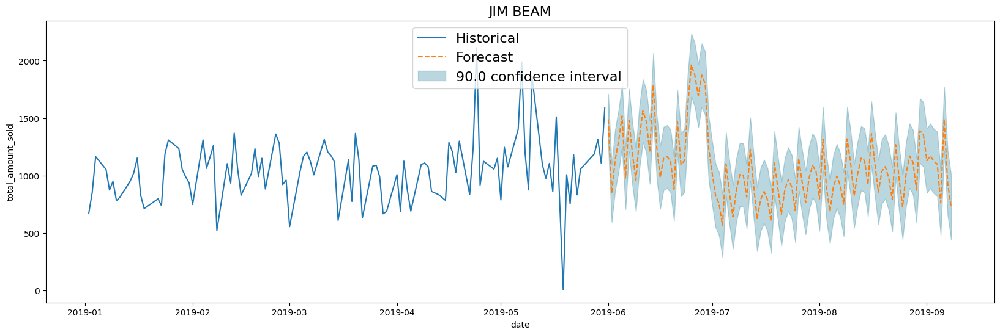

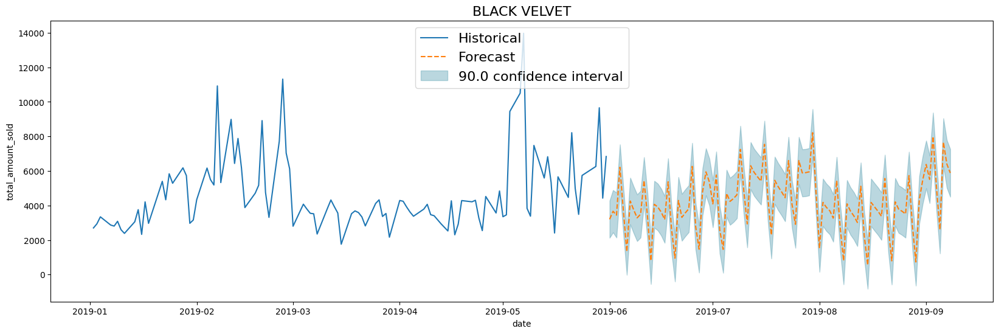

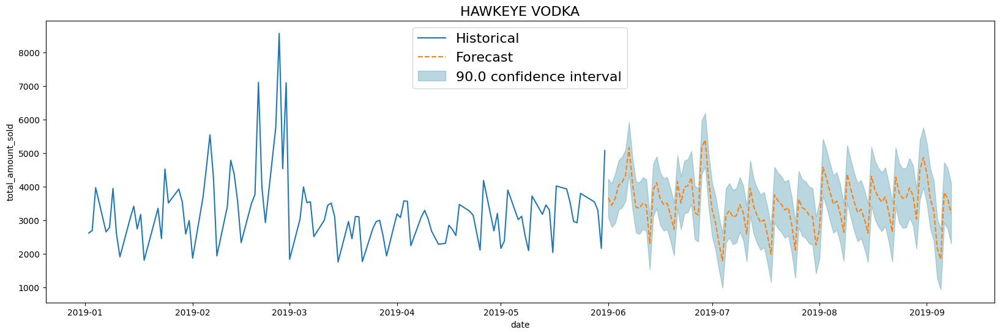

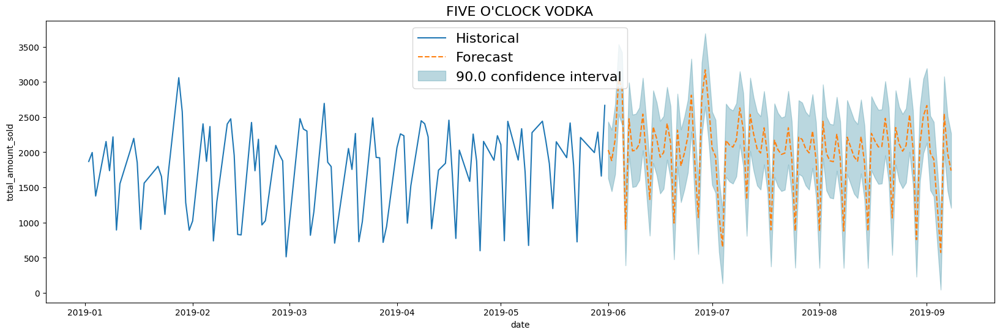

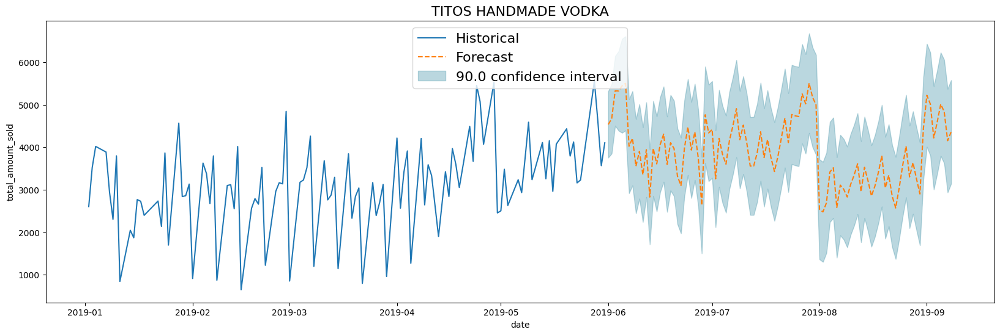

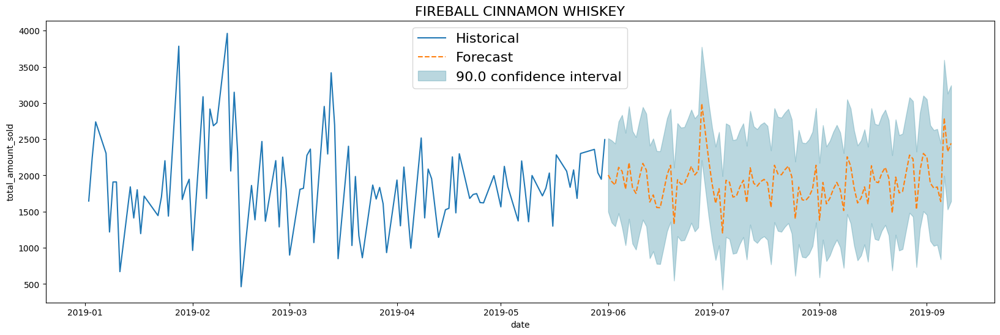

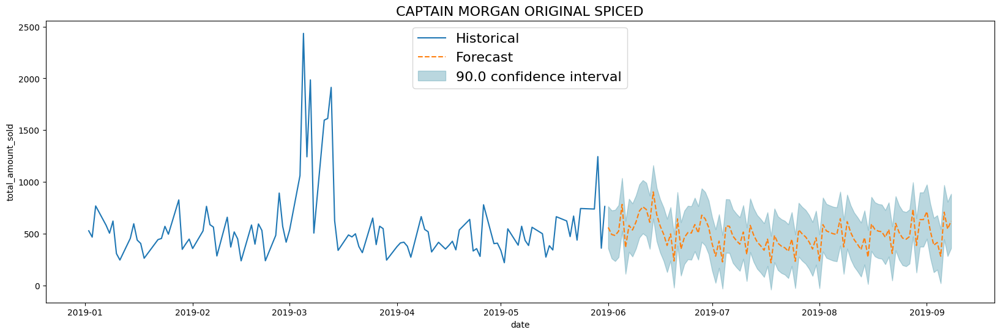

In [47]:
itemslist = list(dfhistorical.item_name.unique())

for item in itemslist:
    datah = dfhistorical[dfhistorical.item_name==item]
    dataf = dfforecast_plus[dfforecast_plus.item_name==item]
    
    plot_historical_and_forecast(input_timeseries = datah, 
                                 timestamp_col_name = "date", 
                                 data_col_name = "total_amount_sold", 
                                 forecast_output = dataf, 
                                 actual = None,
                                 title = item,
                                 plotstartdate = "2019-01-01")

#### Plot the forecasted predictions against the actual data

Save the actual sales data to the `dfactual` Pandas dataframe:

In [48]:
sql = """
        SELECT 
            date,
            item_description AS item_name,
            SUM(bottles_sold) AS total_amount_sold
        FROM
            `bigquery-public-data.iowa_liquor_sales.sales` 
        GROUP BY
            date, item_name
        HAVING 
            date BETWEEN DATE_ADD('2019-06-01', 
                                      INTERVAL 1 DAY) 
                    AND DATE_ADD('2019-06-01', 
                                     INTERVAL 1+CAST(100 AS INT64) DAY) 
        ORDER BY
            date;
       """

query_job = client.query(sql)
dfactual = query_job.to_dataframe()
dfactual.head()

,date,item_name,total_amount_sold
0,2019-06-03,TITOS HANDMADE VODKA,5152
1,2019-06-03,WOODFORD RESERVE,240
2,2019-06-03,DR MCGILLICUDDYS APPLE PIE,51
3,2019-06-03,WINDSOR CANADIAN,102
4,2019-06-03,UV CAKE,92


Plot the forecasted predictions against the training data and actual values, using the `dfhistorical` dataframe that contains the historical data, the `dfforecast_plus` dataframe that contains the prediction data, and the `dfactual` dataframe that contains the actual sales data:

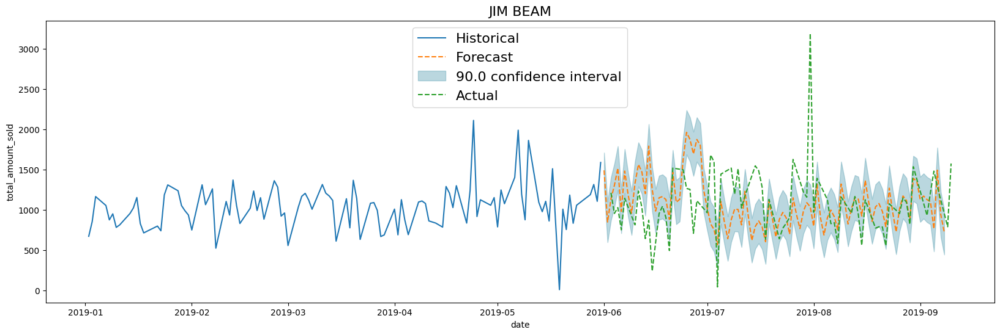

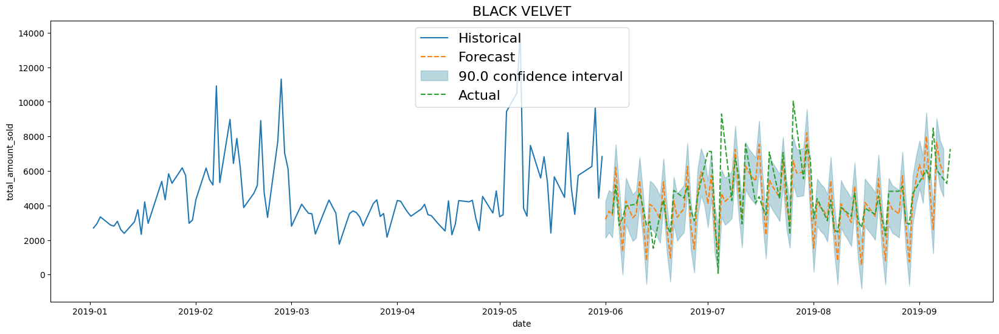

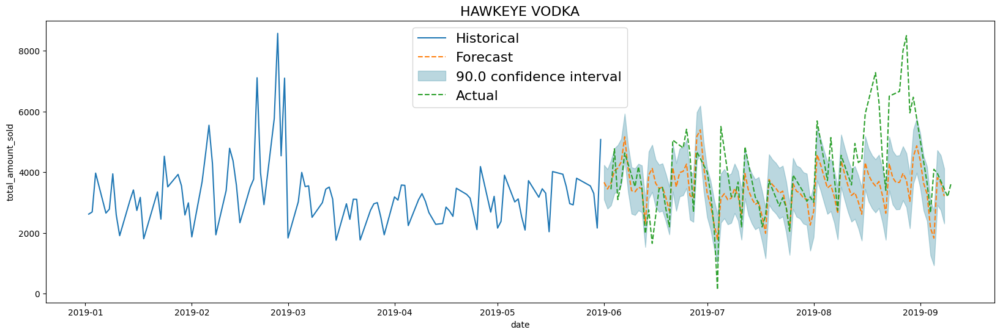

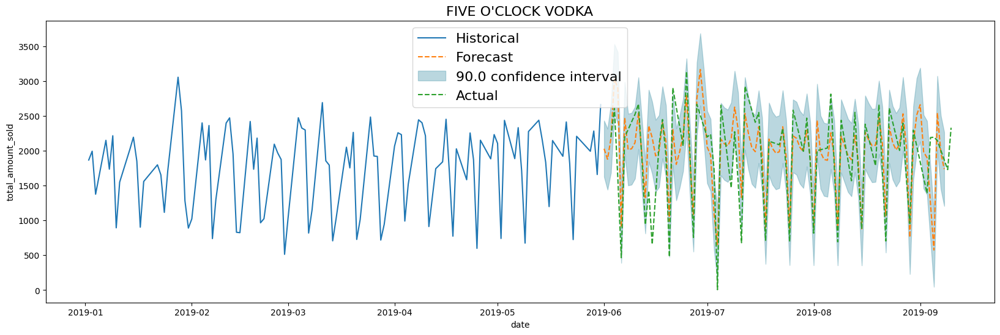

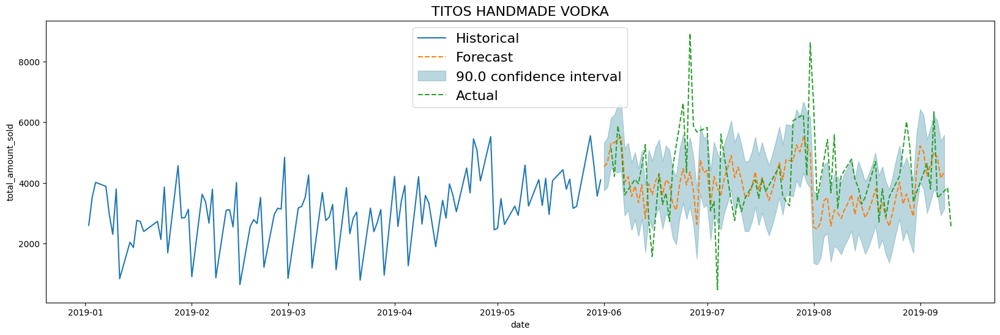

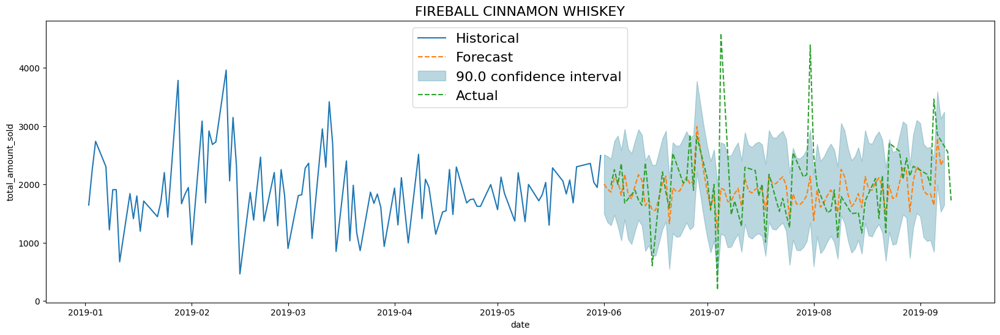

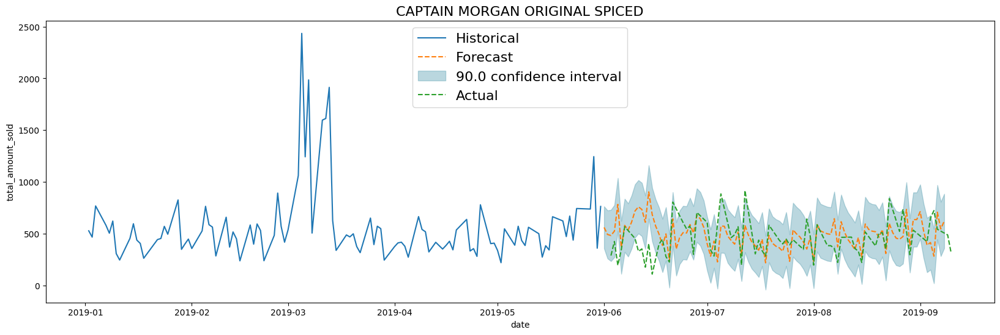

In [49]:
itemslist = list(dfhistorical.item_name.unique())

for item in itemslist:
    datah = dfhistorical[dfhistorical.item_name==item].sort_values('date')
    dataf = dfforecast_plus[dfforecast_plus.item_name==item].sort_values(['forecast_timestamp'])
    dataa = dfactual[dfactual.item_name==item].sort_values('date')
    plot_historical_and_forecast(input_timeseries = datah, 
                             timestamp_col_name = "date", 
                             data_col_name = "total_amount_sold", 
                             forecast_output = dataf, 
                             actual = dataa,
                             title = item,
                             plotstartdate = "2019-01-01")

## Show the Trend, Seasonal, Holiday Effects

See decomposed trend, seasonal effect, and holiday effects. 


In [50]:
dfforcast_result.tail()

,item_name,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,...,holiday_effect_US_PresidentDay,holiday_effect_US_Superbowl,holiday_effect_VeteranDay,holiday_effect_Christmas,holiday_effect_MothersDay,holiday_effect_NewYear,holiday_effect_US_DaylightSavingEnd,holiday_effect_US_DaylightSavingStart,holiday_effect_US_Thanksgiving,holiday_effect_Valentine
8724,TITOS HANDMADE VODKA,2019-05-30 00:00:00+00:00,history,3566.000,3421.936,475.672,NaN,NaN,NaN,4026.827,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
8725,TITOS HANDMADE VODKA,2019-05-31 00:00:00+00:00,history,4102.000,4521.221,475.672,NaN,NaN,NaN,4142.505,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
8726,TITOS HANDMADE VODKA,2019-06-01 00:00:00+00:00,forecast,4535.349,4535.349,475.672,0.950,3604.716,5465.982,4322.642,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
8727,TITOS HANDMADE VODKA,2019-06-02 00:00:00+00:00,forecast,4668.846,4668.846,498.236,0.950,3694.068,5643.625,3862.899,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
8728,TITOS HANDMADE VODKA,2019-06-03 00:00:00+00:00,forecast,5323.217,5323.217,498.262,0.950,4348.388,6298.046,3462.691,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


### Trend 

Get trend component from `dfforcast_result` dataframe

/var/tmp/ipykernel_3732/2000111743.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/2000111743.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/2000111743.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/2000111743.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/2000111743.py:4: UserWarning

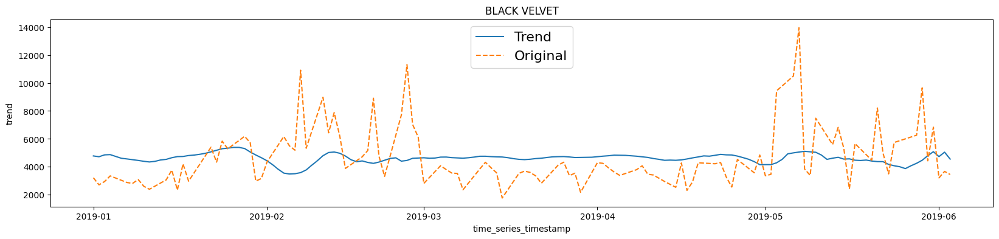

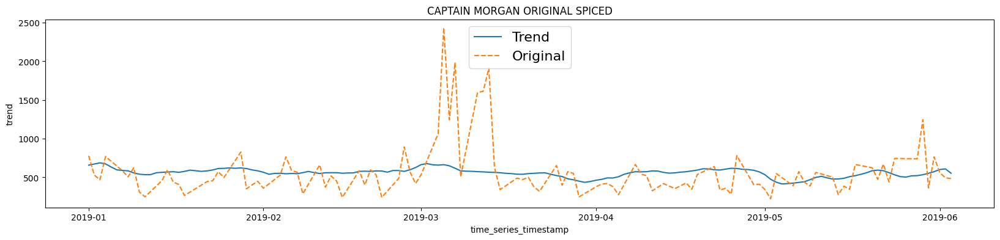

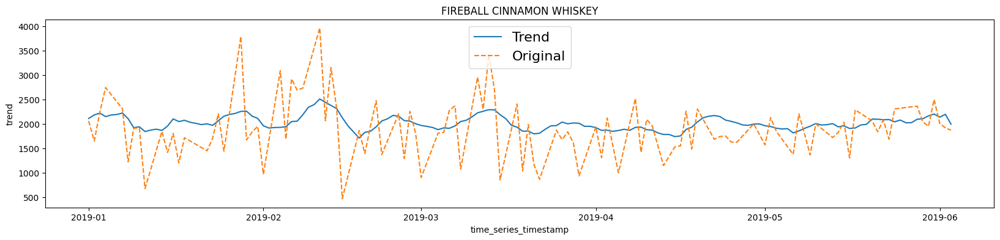

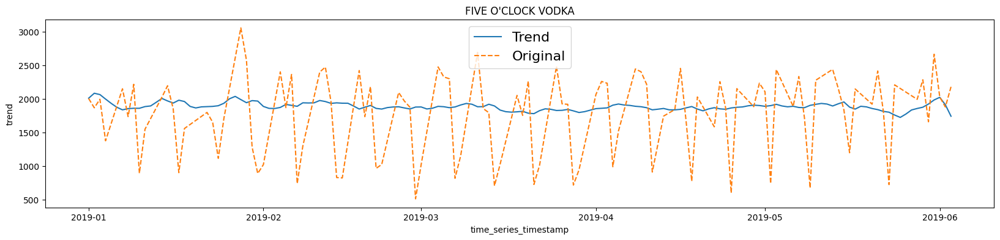

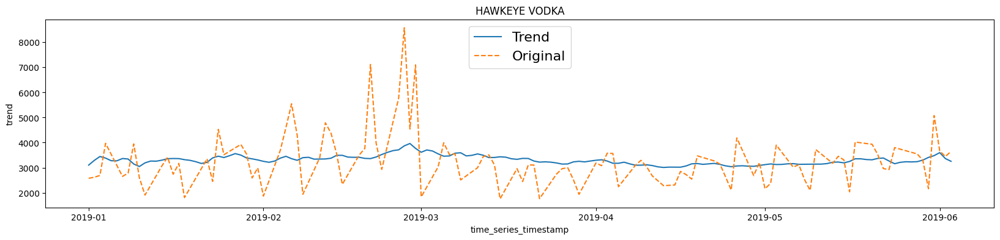

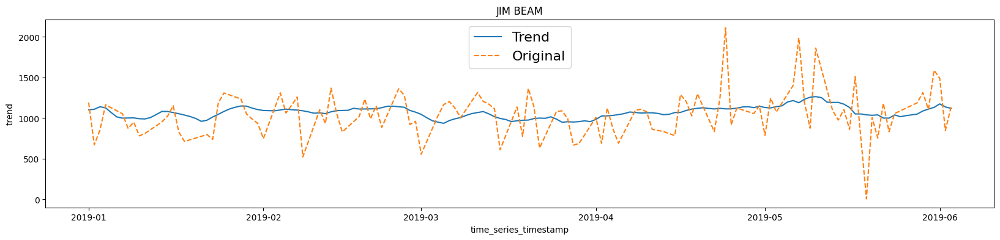

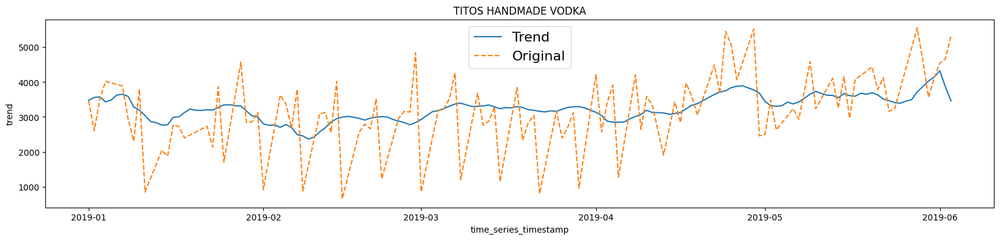

In [51]:

itemslist_trend = list(dfforcast_result.item_name.unique())

for item in itemslist_trend:
    datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
    plt.figure(figsize=(20,4))
    plt.plot(datat["time_series_timestamp"], datat["trend"], label = 'Trend')
    plt.plot(datat["time_series_timestamp"], datat["time_series_data"], alpha = 1, label = 'Original', linestyle='--')
    plt.xlabel("time_series_timestamp")
    plt.ylabel("trend")
    plt.title(item)
    plt.legend(loc = 'upper center', prop={'size': 16})

### Seasonality

Get seasonality(cycle) component from `dfforcast_result` dataframe. There are some time series with multiple seasonalities, and they are all added. 

/var/tmp/ipykernel_3732/2226373792.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/2226373792.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/2226373792.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/2226373792.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/2226373792.py:6: UserWarning

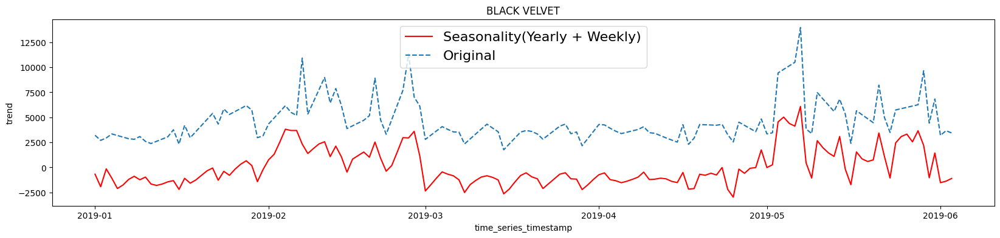

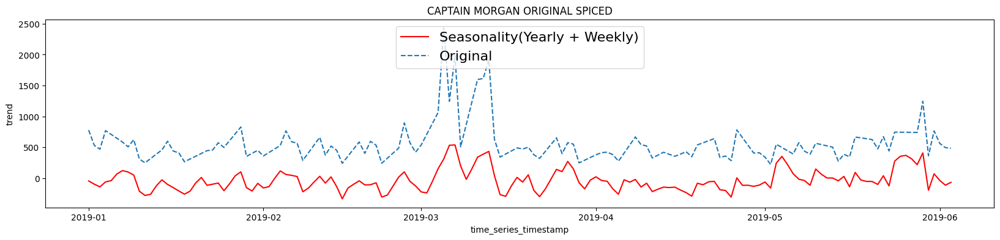

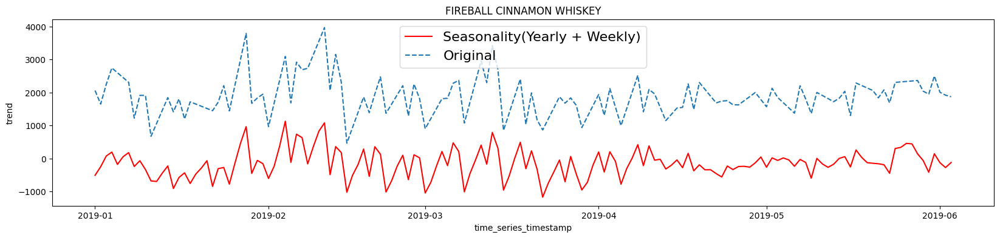

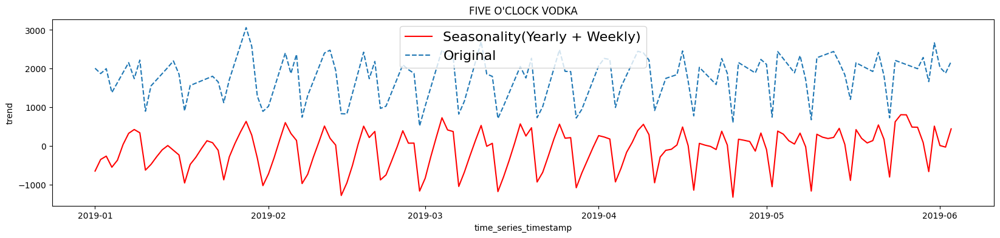

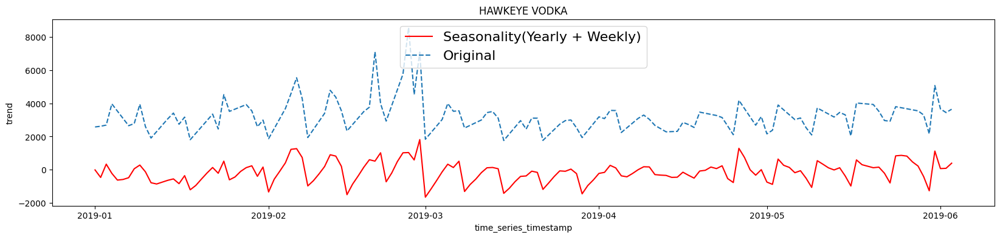

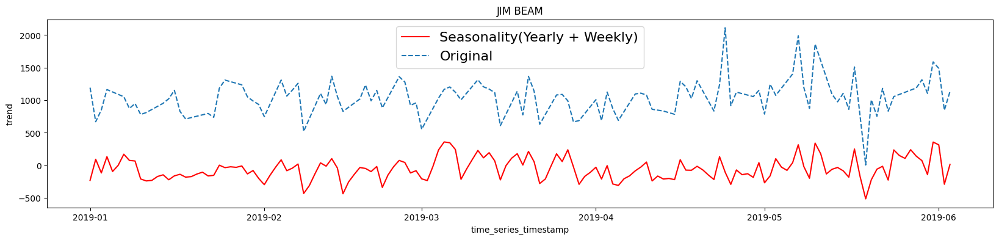

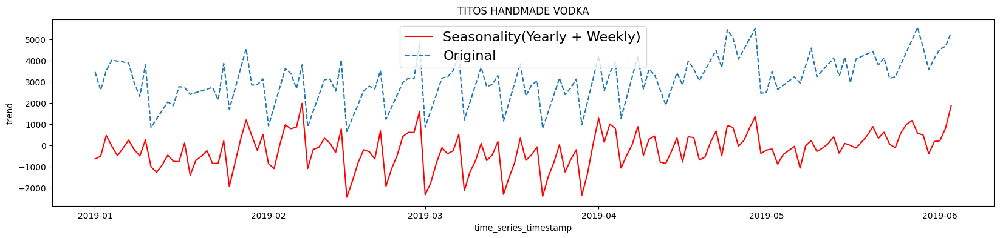

In [53]:
import numpy as np

itemslist_trend = list(dfforcast_result.item_name.unique())

for item in itemslist_trend:
    datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
    plt.figure(figsize=(20,4))
    plt.plot(datat["time_series_timestamp"], datat["seasonal_period_yearly"].replace(np.nan, 0)+datat["seasonal_period_weekly"], label = 'Seasonality(Yearly + Weekly)', color= 'red')
    plt.plot(datat["time_series_timestamp"], datat["time_series_data"], alpha = 1, label = 'Original', linestyle='--')
    plt.xlabel("time_series_timestamp")
    plt.ylabel("trend")
    plt.title(item)
    plt.legend(loc = 'upper center', prop={'size': 16})

### Holiday effect

Get holiday effect components from `dfforcast_result` dataframe. This data is from Iowa, and holiday option is set as `'US'`

/var/tmp/ipykernel_3732/2362459007.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/2362459007.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/2362459007.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/2362459007.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/2362459007.py:4: UserWarning

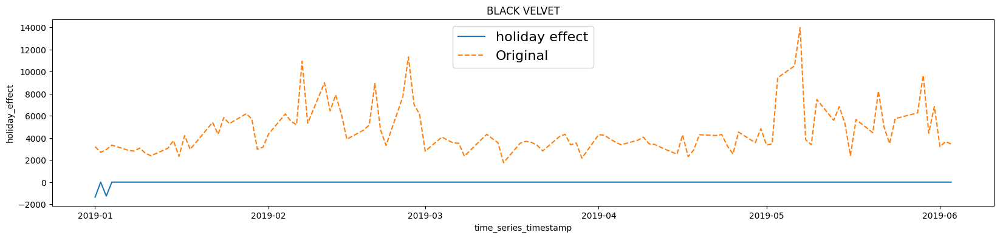

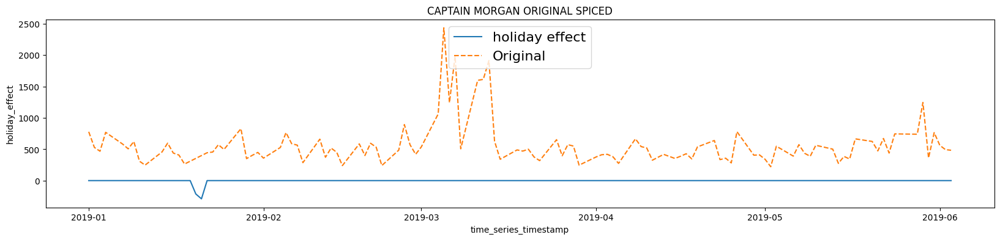

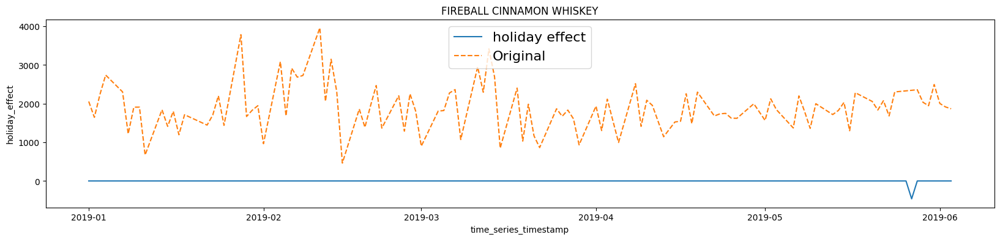

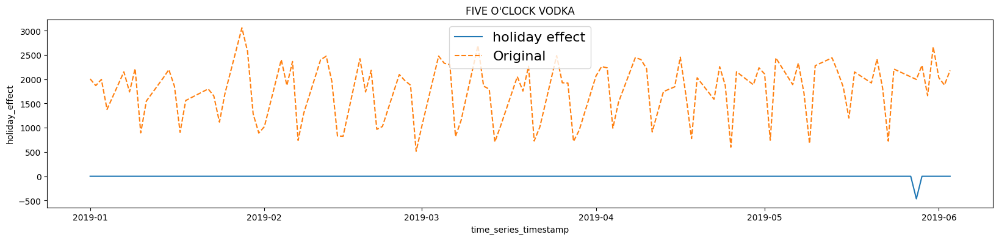

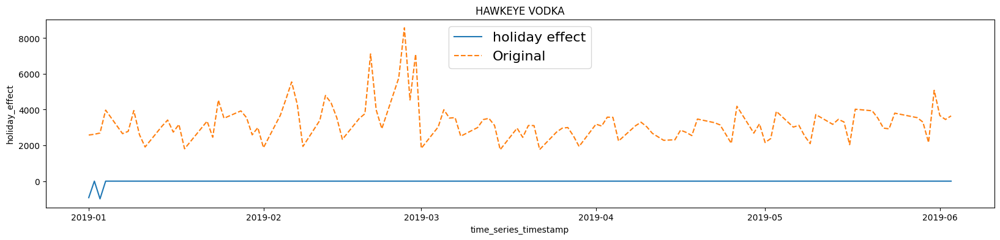

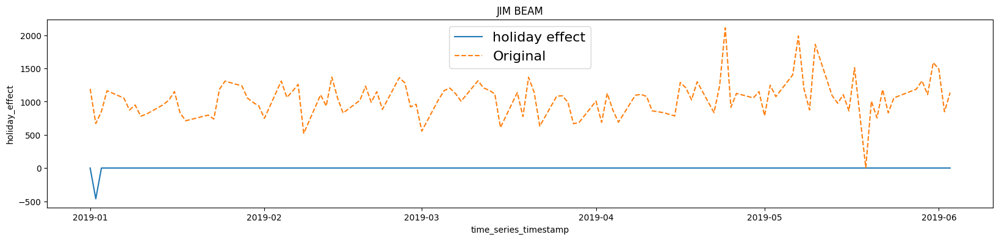

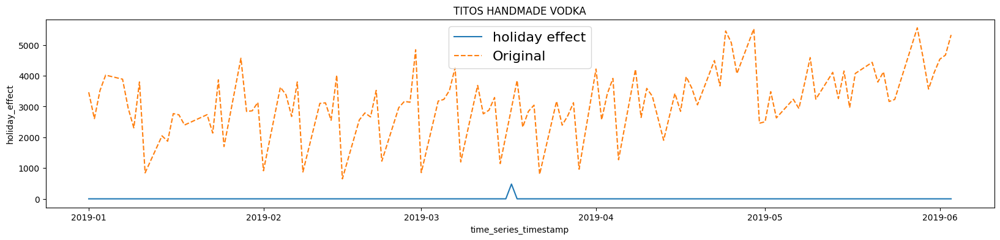

In [54]:
itemslist_trend = list(dfforcast_result.item_name.unique())

for item in itemslist_trend:
    datat = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
    plt.figure(figsize=(20,4))
    plt.plot(datat["time_series_timestamp"], datat["holiday_effect"], label = "holiday effect")
    plt.plot(datat["time_series_timestamp"], datat["time_series_data"], alpha = 1, label = 'Original', linestyle='--')
    plt.xlabel("time_series_timestamp")
    plt.ylabel("holiday_effect")
    plt.title(item)
    plt.legend(loc = 'upper center', prop={'size': 16})


In [55]:
## save explain_forecast result to bigquery table
sql = """
        CREATE OR REPLACE TABLE bqmlforecast.first_trained AS (
        SELECT  *, COALESCE(seasonal_period_yearly, 0, seasonal_period_yearly) + seasonal_period_weekly as seasonal
        FROM 
          ML.EXPLAIN_FORECAST(MODEL bqmlforecast.arima_plus_model)
        );
    """

query_job = client.query(sql)

In [56]:
sql = """
        SELECT * 
        FROM bqmlforecast.first_trained
        LIMIT 10;
      """

query_job = client.query(sql)
df = query_job.to_dataframe()
df.head()

,item_name,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,...,holiday_effect_US_Superbowl,holiday_effect_VeteranDay,holiday_effect_Christmas,holiday_effect_MothersDay,holiday_effect_NewYear,holiday_effect_US_DaylightSavingEnd,holiday_effect_US_DaylightSavingStart,holiday_effect_US_Thanksgiving,holiday_effect_Valentine,seasonal
0,BLACK VELVET,2016-01-22 00:00:00+00:00,history,3923.000,3667.150,653.211,NaN,NaN,NaN,5288.926,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-1637.235
1,BLACK VELVET,2016-02-24 00:00:00+00:00,history,6294.000,7135.164,653.211,NaN,NaN,NaN,5762.696,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,1710.792
2,BLACK VELVET,2016-03-24 00:00:00+00:00,history,3692.000,3499.045,653.211,NaN,NaN,NaN,5311.662,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-1735.121
3,BLACK VELVET,2016-03-30 00:00:00+00:00,history,4340.000,4174.913,653.211,NaN,NaN,NaN,5334.349,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-1140.108
4,BLACK VELVET,2016-05-17 00:00:00+00:00,history,7279.000,8227.892,653.211,NaN,NaN,NaN,5116.956,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,2990.407


## Forecasting Trend & Seasonality 

Trend and seasonality are quite stable component in time-series data, and they can be forecasted more exact. Trend and seasonality forecasting can be useful to prepare the future with the overall view. It may be not exact value, but more predictable direction.

### Trend forecasting

Apply trend data to ARIMA+ again

In [58]:
sql = """
        CREATE OR REPLACE MODEL bqmlforecast.arima_trend_model

        OPTIONS(
          MODEL_TYPE='ARIMA_PLUS',
          TIME_SERIES_TIMESTAMP_COL='time_series_timestamp', 
          TIME_SERIES_DATA_COL='trend',
          TIME_SERIES_ID_COL='item_name'
        ) AS

        SELECT 
            time_series_timestamp,
            item_name,
            trend
        FROM
          bqmlforecast.first_trained
        """

query_job = client.query(sql)


In [59]:
sql = """
    SELECT
      *
    FROM
      ML.ARIMA_EVALUATE(MODEL bqmlforecast.arima_trend_model)
      """

query_job = client.query(sql)
df = query_job.to_dataframe()
df.head()

,item_name,non_seasonal_p,non_seasonal_d,non_seasonal_q,has_drift,log_likelihood,AIC,variance,seasonal_periods,has_holiday_effect,has_spikes_and_dips,has_step_changes,error_message
0,BLACK VELVET,2,1,3,False,-7255.735,14523.470,6649.189,[WEEKLY],False,False,True,
1,CAPTAIN MORGAN ORIGINAL SPICED,2,1,3,True,-5186.718,10387.437,239.754,[NO_SEASONALITY],False,False,True,
2,FIREBALL CINNAMON WHISKEY,0,1,5,False,-6655.584,13323.167,2531.511,[WEEKLY],False,False,True,
3,FIVE O'CLOCK VODKA,0,1,5,False,-6097.616,12207.232,1031.892,[WEEKLY],False,False,True,
4,HAWKEYE VODKA,0,1,5,False,-6576.220,13164.439,2223.781,[WEEKLY],False,False,True,


In [60]:

sql = """
    SELECT
      *
    FROM 
      ML.FORECAST(MODEL bqmlforecast.arima_trend_model, 
                  STRUCT(100 AS horizon, 
                         0.90 AS confidence_level)
                 )
    """
query_job = client.query(sql)
dfforecast_trend = query_job.to_dataframe()
dfforecast_trend.head()

,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound
0,BLACK VELVET,2019-06-04 00:00:00+00:00,4389.642,81.545,0.900,4255.659,4523.626,4255.659,4523.626
1,BLACK VELVET,2019-06-05 00:00:00+00:00,4301.298,141.917,0.900,4068.118,4534.479,4068.118,4534.479
2,BLACK VELVET,2019-06-06 00:00:00+00:00,4140.375,196.857,0.900,3816.925,4463.825,3816.925,4463.825
3,BLACK VELVET,2019-06-07 00:00:00+00:00,3990.326,268.062,0.900,3549.881,4430.770,3549.881,4430.770
4,BLACK VELVET,2019-06-08 00:00:00+00:00,3788.793,350.164,0.900,3213.449,4364.137,3213.449,4364.137


In [61]:
sql = """
CREATE OR REPLACE MODEL bqmlforecast.arima_seasons_model

OPTIONS(
  MODEL_TYPE='ARIMA_PLUS',
  TIME_SERIES_TIMESTAMP_COL='time_series_timestamp', 
  TIME_SERIES_DATA_COL='seasonal',
  TIME_SERIES_ID_COL='item_name'
) AS

SELECT 
    time_series_timestamp,
    item_name,
    seasonal
FROM
  bqmlforecast.first_trained
    """
query_job = client.query(sql)

### Seasonality forecasting

Apply seasonality data to ARIMA+ again

In [177]:
sql = """
    SELECT
      *
    FROM 
      ML.FORECAST(MODEL bqmlforecast.arima_seasons_model, 
                  STRUCT(100 AS horizon, 
                         0.90 AS confidence_level)
                 )
    """
query_job = client.query(sql)
dfforecast_seasons = query_job.to_dataframe()
dfforecast_seasons.head()


,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound
0,BLACK VELVET,2019-06-04 00:00:00+00:00,1466.598,17.216,0.900,1438.312,1494.885,1438.312,1494.885
1,BLACK VELVET,2019-06-05 00:00:00+00:00,-1300.010,32.497,0.900,-1353.405,-1246.616,-1353.405,-1246.616
2,BLACK VELVET,2019-06-06 00:00:00+00:00,-3587.851,27.622,0.900,-3633.236,-3542.466,-3633.236,-3542.466
3,BLACK VELVET,2019-06-07 00:00:00+00:00,-183.041,34.158,0.900,-239.165,-126.917,-239.165,-126.917
4,BLACK VELVET,2019-06-08 00:00:00+00:00,-755.503,28.188,0.900,-801.818,-709.188,-801.818,-709.188


In [80]:
# prepare data for time series decomposition with longer period
sql = """
        CREATE OR REPLACE TABLE bqmlforecast.training_data2 AS (
            WITH topsellingitems AS(
                 SELECT 
                    item_description,
                    count(item_description) cnt_transactions
                FROM
                    `bigquery-public-data.iowa_liquor_sales.sales` 
                GROUP BY 
                    item_description
                ORDER BY cnt_transactions DESC
                LIMIT 7
            )
            SELECT 
                date,
                item_description AS item_name,
                SUM(bottles_sold) AS total_amount_sold
            FROM
                `bigquery-public-data.iowa_liquor_sales.sales` 
            GROUP BY
                date, item_name
            HAVING 
                date BETWEEN '2016-01-01' AND "2020-12-31"
                AND item_description IN (SELECT item_description FROM topsellingitems)
            );
    """
query_job = client.query(sql)
df = query_job.to_dataframe()
df.head()

""


In [81]:
## time series decomposition
sql = """
        CREATE OR REPLACE MODEL bqmlforecast.arima_dec_model

        OPTIONS(
          MODEL_TYPE='ARIMA_PLUS',
          TIME_SERIES_TIMESTAMP_COL='date', 
          TIME_SERIES_DATA_COL='total_amount_sold',
          TIME_SERIES_ID_COL='item_name',
          HOLIDAY_REGION='US', 
          DECOMPOSE_TIME_SERIES = TRUE,
          CLEAN_SPIKES_AND_DIPS = TRUE, 
          TREND_SMOOTHING_WINDOW_SIZE = 7
        ) AS

        SELECT 
            date,
            item_name,
            total_amount_sold
        FROM
          bqmlforecast.training_data2
      """
query_job = client.query(sql)

In [84]:
sql = """
        CREATE OR REPLACE TABLE bqmlforecast.whole_trained AS (
        SELECT  *, COALESCE(seasonal_period_yearly, 0, seasonal_period_yearly) + seasonal_period_weekly as seasonal
        FROM 
          ML.EXPLAIN_FORECAST(MODEL bqmlforecast.arima_dec_model)
        );
      """
query_job = client.query(sql)

In [85]:
sql = """
    select * 
    FROM bqmlforecast.whole_trained
    limit 10;
      """
query_job = client.query(sql)
df = query_job.to_dataframe()
df.head()

,item_name,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,...,holiday_effect_US_Superbowl,holiday_effect_VeteranDay,holiday_effect_Christmas,holiday_effect_MothersDay,holiday_effect_NewYear,holiday_effect_US_DaylightSavingEnd,holiday_effect_US_DaylightSavingStart,holiday_effect_US_Thanksgiving,holiday_effect_Valentine,seasonal
0,BLACK VELVET,2016-03-02 00:00:00+00:00,history,4107.000,4215.497,714.171,NaN,NaN,NaN,4940.693,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-662.674
1,BLACK VELVET,2016-07-20 00:00:00+00:00,history,5213.000,5564.355,714.171,NaN,NaN,NaN,4451.643,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,870.253
2,BLACK VELVET,2016-08-26 00:00:00+00:00,history,2542.000,2656.060,714.171,NaN,NaN,NaN,4487.346,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-1722.623
3,BLACK VELVET,2016-11-16 00:00:00+00:00,history,5313.000,4873.455,714.171,NaN,NaN,NaN,4840.228,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,494.759
4,BLACK VELVET,2017-03-25 00:00:00+00:00,history,2846.000,3056.829,714.171,NaN,NaN,NaN,4557.053,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-1461.143


### Plot trend forecasting

Plot trend forecasting result and compare with original trend data

In [87]:
#number of values to forecast : 100
sql = """    
SELECT 
    time_series_timestamp as date,
    item_name,
    trend as total_amount_sold
FROM
    bqmlforecast.whole_trained
WHERE
     CAST(time_series_timestamp AS DATE) BETWEEN DATE_ADD('2019-06-01', 
                              INTERVAL 1 DAY) 
            AND DATE_ADD('2019-06-01', 
                             INTERVAL 1+CAST(100 AS INT64) DAY) 
ORDER BY
     time_series_timestamp;
    """
query_job = client.query(sql)
dfactual_trend = query_job.to_dataframe()
dfactual_trend.head()

,date,item_name,total_amount_sold
0,2019-06-02 00:00:00+00:00,CAPTAIN MORGAN ORIGINAL SPICED,1717.129
1,2019-06-02 00:00:00+00:00,HAWKEYE VODKA,3031.468
2,2019-06-02 00:00:00+00:00,FIVE O'CLOCK VODKA,1767.827
3,2019-06-02 00:00:00+00:00,JIM BEAM,1191.391
4,2019-06-02 00:00:00+00:00,FIREBALL CINNAMON WHISKEY,5081.791


/var/tmp/ipykernel_3732/743844682.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datah = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/743844682.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datah = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/743844682.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datah = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/743844682.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datah = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/743844682.py:4: UserWarning: Boo

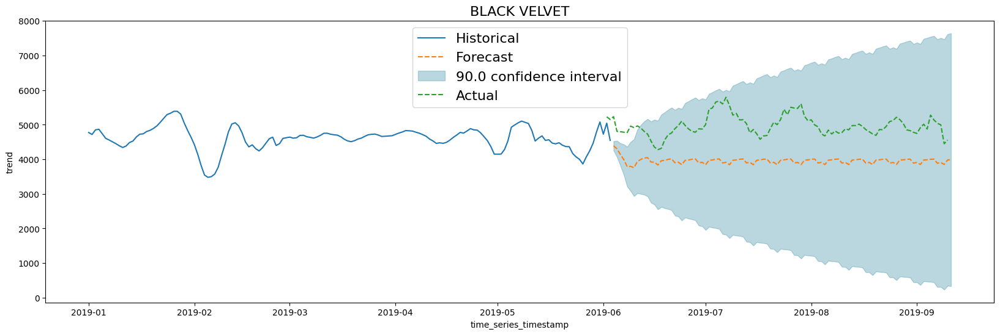

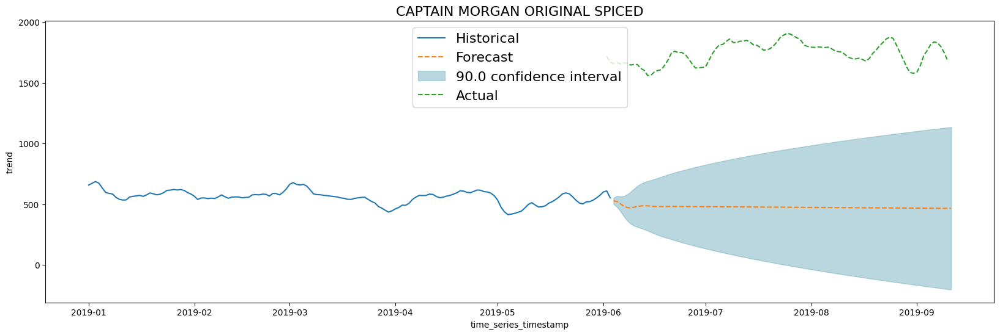

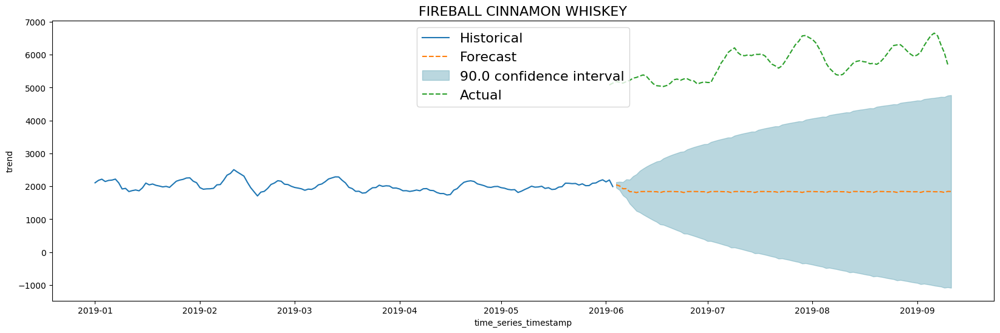

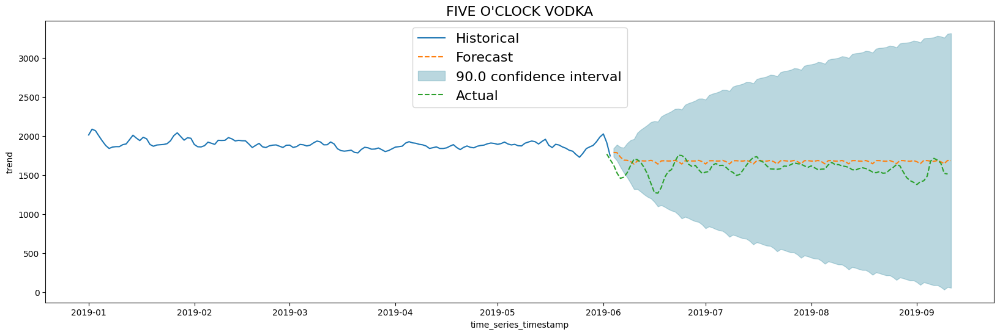

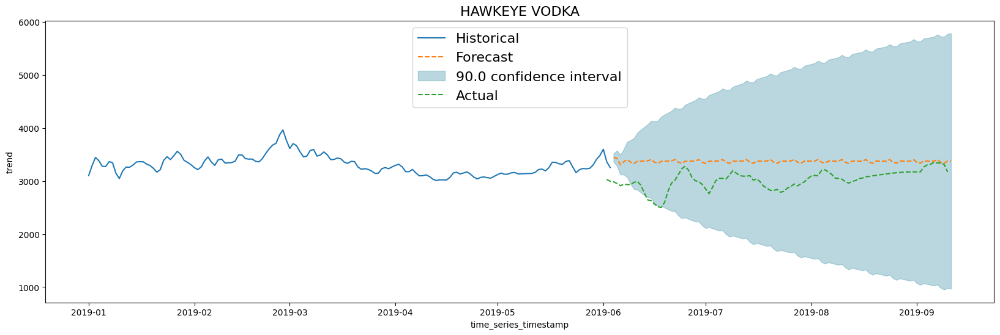

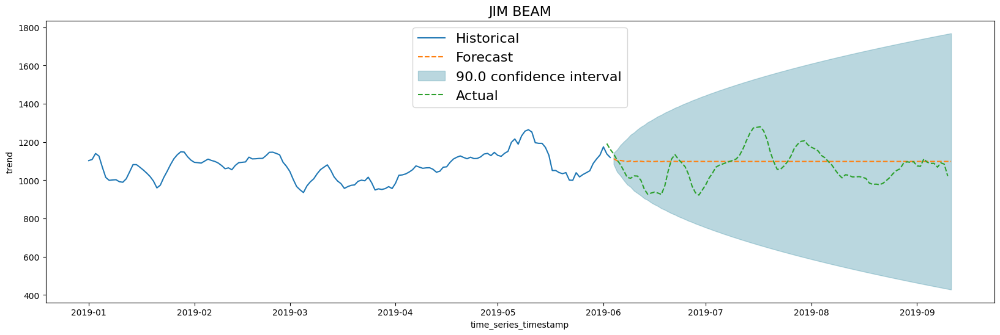

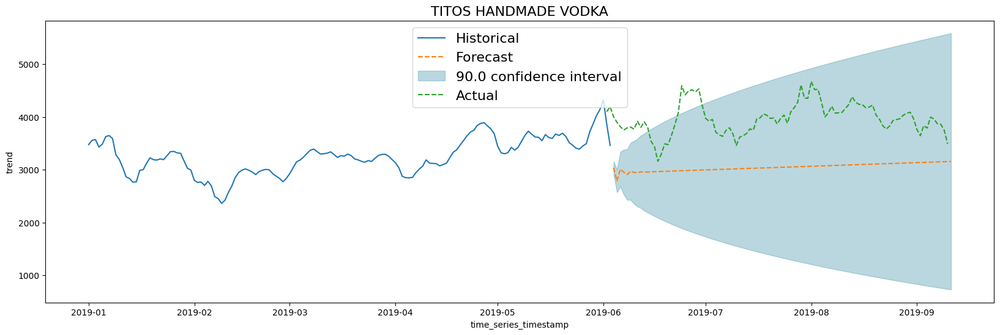

In [88]:
itemslist = list(dfforcast_result.item_name.unique())

for item in itemslist:
    datah = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
    dataf = dfforecast_trend[dfforecast_trend.item_name==item].sort_values(['forecast_timestamp'])
    dataa = dfactual_trend[dfactual_trend.item_name==item].sort_values('date')
    plot_historical_and_forecast(input_timeseries = datah, 
                             timestamp_col_name = "time_series_timestamp", 
                             data_col_name = "trend", 
                             forecast_output = dataf, 
                             actual = dataa,
                             title = item,
                             plotstartdate = "2018-06-01 00:00:00+00:00")

### Plot seasonality forecasting

Plot seasonality forecasting result and compare with original seasonality data

In [175]:
dfforcast_result['seasonal'] = dfforcast_result["seasonal_period_yearly"].replace(np.nan, 0)+dfforcast_result["seasonal_period_weekly"]

dfforcast_result.head()

,item_name,time_series_timestamp,time_series_type,time_series_data,time_series_adjusted_data,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,trend,...,holiday_effect_US_Superbowl,holiday_effect_VeteranDay,holiday_effect_Christmas,holiday_effect_MothersDay,holiday_effect_NewYear,holiday_effect_US_DaylightSavingEnd,holiday_effect_US_DaylightSavingStart,holiday_effect_US_Thanksgiving,holiday_effect_Valentine,seasonal
0,BLACK VELVET,2016-01-04 00:00:00+00:00,history,5014.000,5014.000,653.211,NaN,NaN,NaN,2426.747,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-830.405
1,BLACK VELVET,2016-01-05 00:00:00+00:00,history,5193.000,5302.536,653.211,NaN,NaN,NaN,3224.426,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-541.867
2,BLACK VELVET,2016-01-06 00:00:00+00:00,history,4422.000,4995.207,653.211,NaN,NaN,NaN,4031.302,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-771.434
3,BLACK VELVET,2016-01-07 00:00:00+00:00,history,3760.000,3513.590,653.211,NaN,NaN,NaN,4802.864,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-1862.592
4,BLACK VELVET,2016-01-08 00:00:00+00:00,history,3943.000,3944.318,653.211,NaN,NaN,NaN,5592.465,...,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,-1639.436


In [178]:
dfforecast_seasons['seasonal'] = dfforecast_seasons['forecast_value']

dfforecast_seasons.head()

,item_name,forecast_timestamp,forecast_value,standard_error,confidence_level,prediction_interval_lower_bound,prediction_interval_upper_bound,confidence_interval_lower_bound,confidence_interval_upper_bound,seasonal
0,BLACK VELVET,2019-06-04 00:00:00+00:00,1466.598,17.216,0.900,1438.312,1494.885,1438.312,1494.885,1466.598
1,BLACK VELVET,2019-06-05 00:00:00+00:00,-1300.010,32.497,0.900,-1353.405,-1246.616,-1353.405,-1246.616,-1300.010
2,BLACK VELVET,2019-06-06 00:00:00+00:00,-3587.851,27.622,0.900,-3633.236,-3542.466,-3633.236,-3542.466,-3587.851
3,BLACK VELVET,2019-06-07 00:00:00+00:00,-183.041,34.158,0.900,-239.165,-126.917,-239.165,-126.917,-183.041
4,BLACK VELVET,2019-06-08 00:00:00+00:00,-755.503,28.188,0.900,-801.818,-709.188,-801.818,-709.188,-755.503


In [183]:
sql = """    
SELECT 
    time_series_timestamp as date,
    item_name,
    seasonal_period_weekly + seasonal_period_yearly as total_amount_sold
FROM
    bqmlforecast.whole_trained
WHERE
     CAST(time_series_timestamp AS DATE) BETWEEN DATE_ADD('2019-06-01', 
                              INTERVAL 1 DAY) 
            AND DATE_ADD('2019-06-01', 
                             INTERVAL 1+CAST(100 AS INT64) DAY) 
ORDER BY
     time_series_timestamp;
    """
query_job = client.query(sql)
dfactual_seasons = query_job.to_dataframe()
dfactual_seasons.head()

,date,item_name,total_amount_sold
0,2019-06-02 00:00:00+00:00,CAPTAIN MORGAN ORIGINAL SPICED,-180.460
1,2019-06-02 00:00:00+00:00,HAWKEYE VODKA,232.102
2,2019-06-02 00:00:00+00:00,FIVE O'CLOCK VODKA,236.233
3,2019-06-02 00:00:00+00:00,JIM BEAM,54.743
4,2019-06-02 00:00:00+00:00,FIREBALL CINNAMON WHISKEY,254.643


/var/tmp/ipykernel_3732/1875570559.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datah = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/1875570559.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datah = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/1875570559.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datah = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/1875570559.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  datah = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
/var/tmp/ipykernel_3732/1875570559.py:4: UserWarning

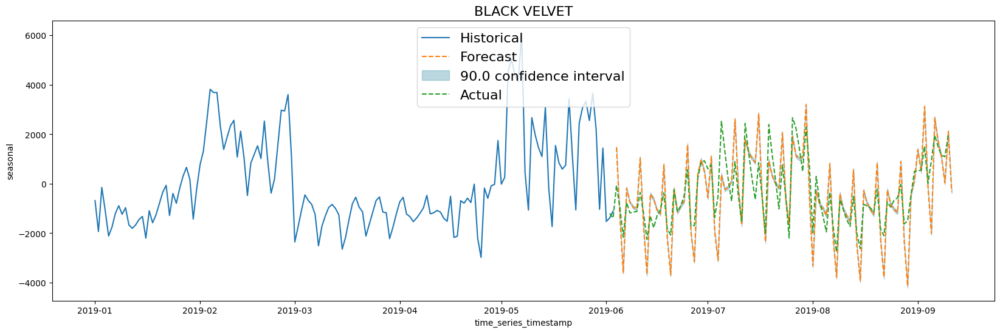

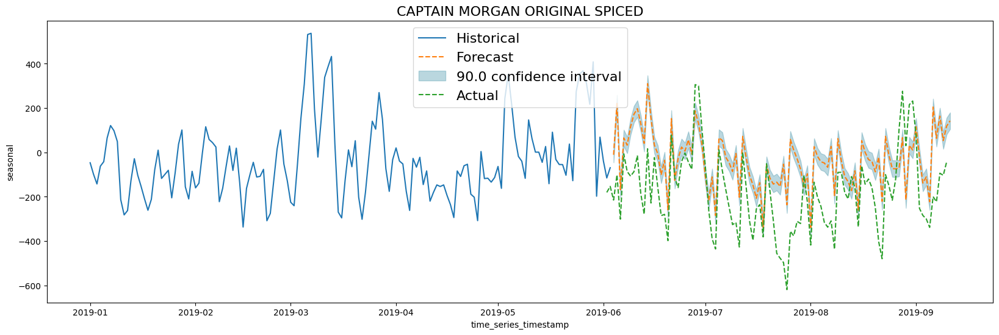

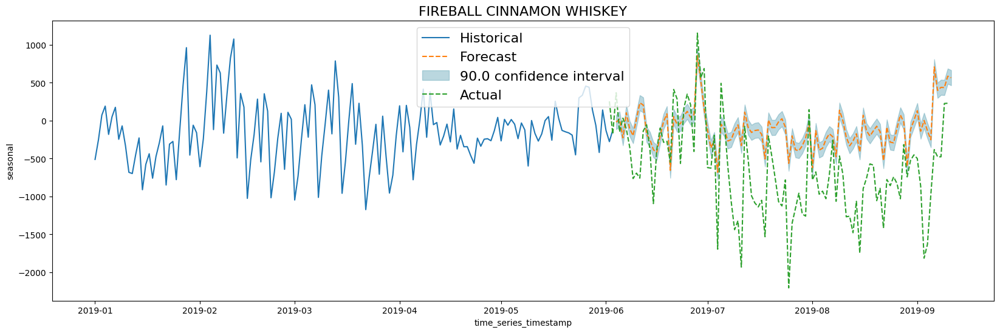

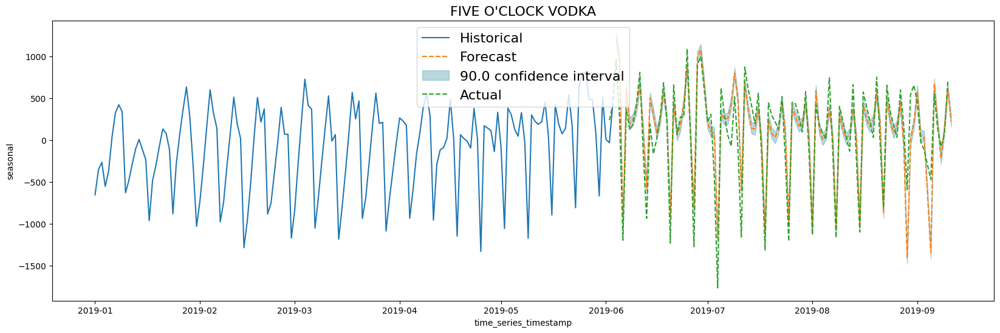

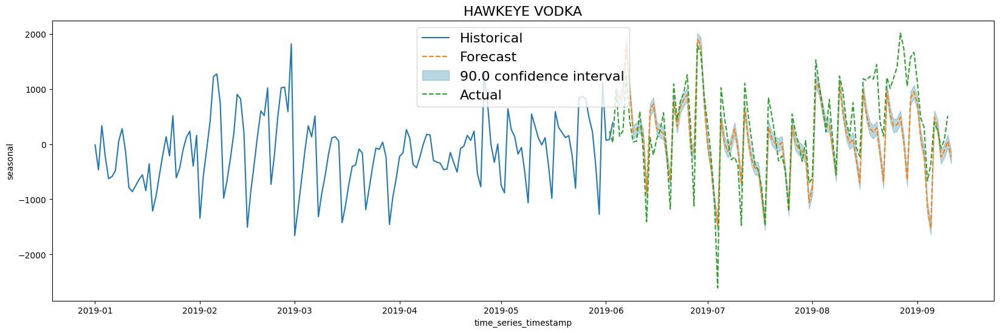

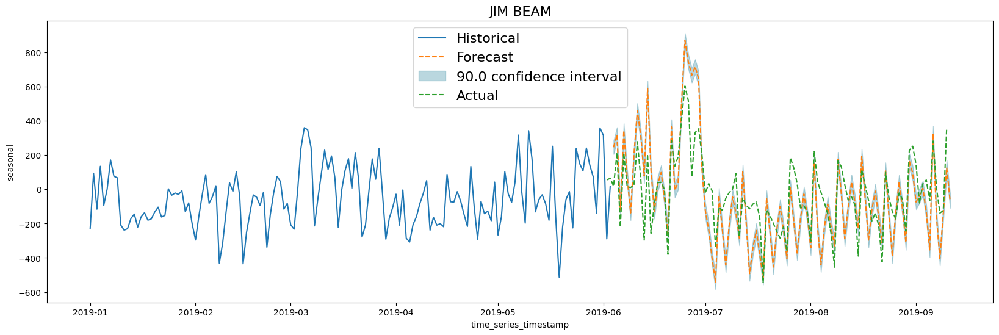

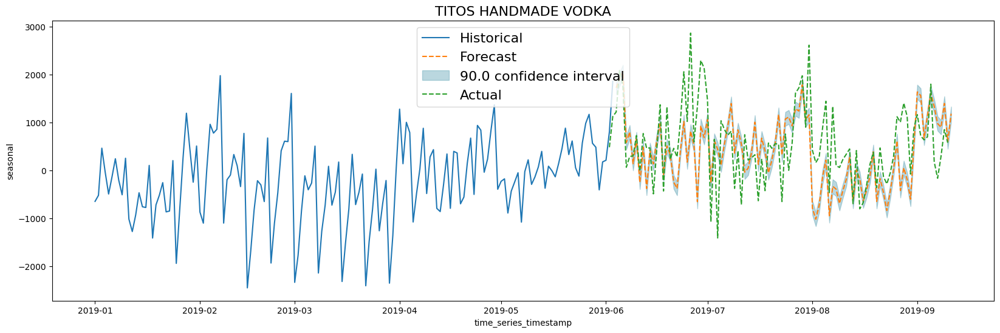

In [184]:
itemslist = list(dfforcast_result.item_name.unique())

for item in itemslist:
    datah = dfforcast_result[dfforcast_result.item_name==item][dfforcast_result["time_series_timestamp"] >= '2019-01-01']
    dataf = dfforecast_seasons[dfforecast_seasons.item_name==item].sort_values(['forecast_timestamp'])
    dataa = dfactual_seasons[dfactual_seasons.item_name==item].sort_values('date')
    plot_historical_and_forecast(input_timeseries = datah, 
                             timestamp_col_name = "time_series_timestamp", 
                             data_col_name = "seasonal", 
                             forecast_output = dataf, 
                             actual = dataa,
                             title = item,
                             plotstartdate = "2018-06-01 00:00:00+00:00")

# Plot trend + seasonality forecasting

Plot  trend + seasonality forecasting result and compare with original trend + seasonality data. It can be more predictable when the data has strong trend or seasonality, and understand data without noise. 

In [185]:
itemslist = list(dfhistorical.item_name.unique())
dfforecast_seasons = dfforecast_seasons.set_index(['item_name','forecast_timestamp'])
dfforecast_trend = dfforecast_trend.set_index(['item_name','forecast_timestamp'])
new_for = dfforecast_seasons + dfforecast_trend

new_for.head()

KeyError: "None of ['item_name', 'forecast_timestamp'] are in the columns"

In [189]:
new_for= new_for.reset_index()

In [190]:
sql = """    
SELECT 
    time_series_timestamp as date,
    item_name,
    trend+seasonal as total_amount_sold
FROM
    bqmlforecast.whole_trained
WHERE
     CAST(time_series_timestamp AS DATE) BETWEEN '2016-01-01'
            AND DATE_ADD('2019-06-01', 
                             INTERVAL 1+CAST(100 AS INT64) DAY) 
ORDER BY
     time_series_timestamp;
    """
query_job = client.query(sql)
dfactual_full = query_job.to_dataframe()
dfactual_full.head()

,date,item_name,total_amount_sold
0,2016-01-04 00:00:00+00:00,FIVE O'CLOCK VODKA,1332.639
1,2016-01-04 00:00:00+00:00,BLACK VELVET,1524.872
2,2016-01-04 00:00:00+00:00,HAWKEYE VODKA,983.452
3,2016-01-04 00:00:00+00:00,FIREBALL CINNAMON WHISKEY,2641.324
4,2016-01-04 00:00:00+00:00,TITOS HANDMADE VODKA,457.120


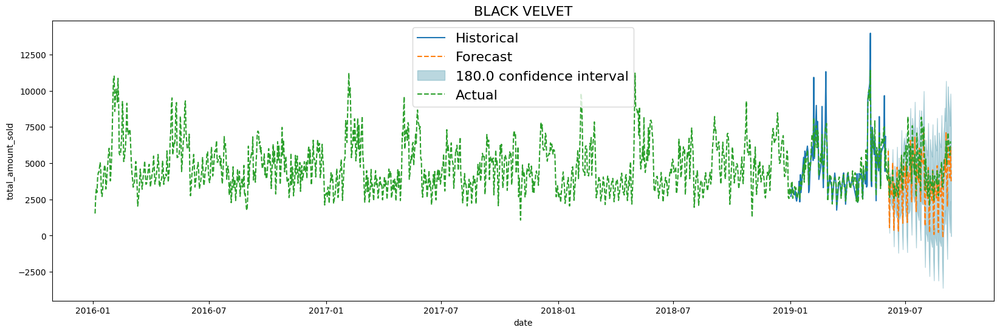

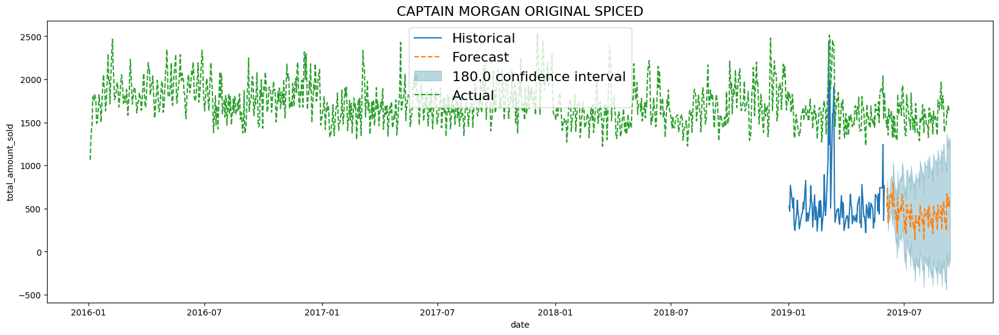

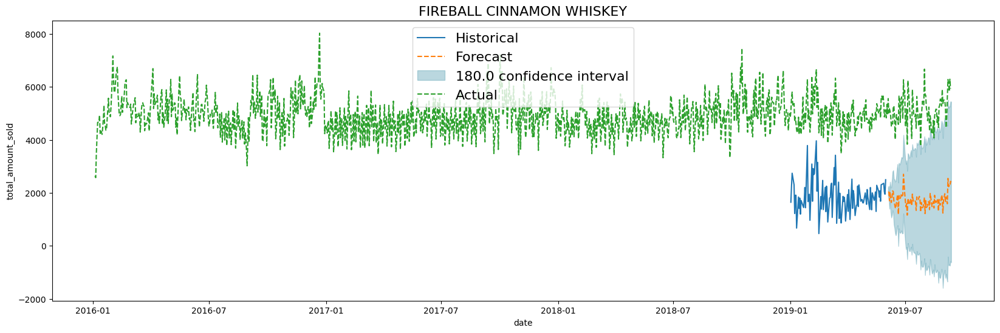

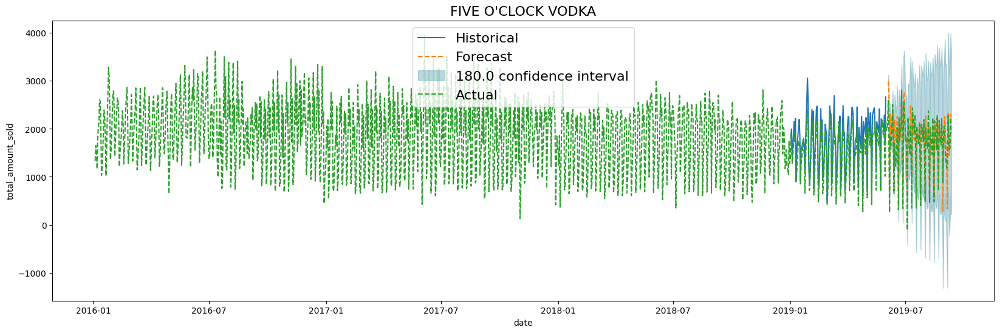

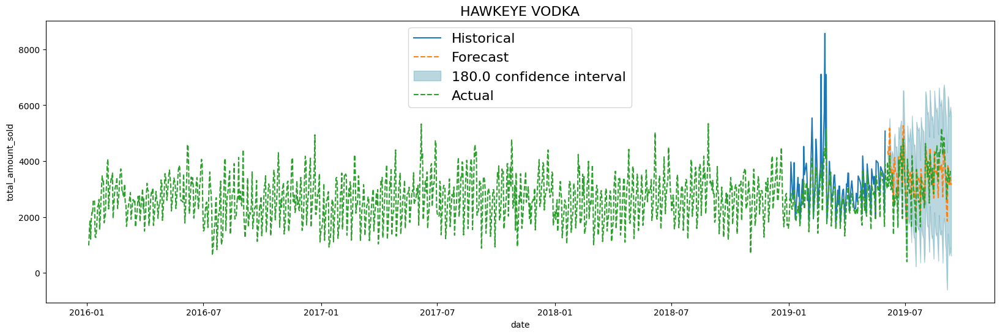

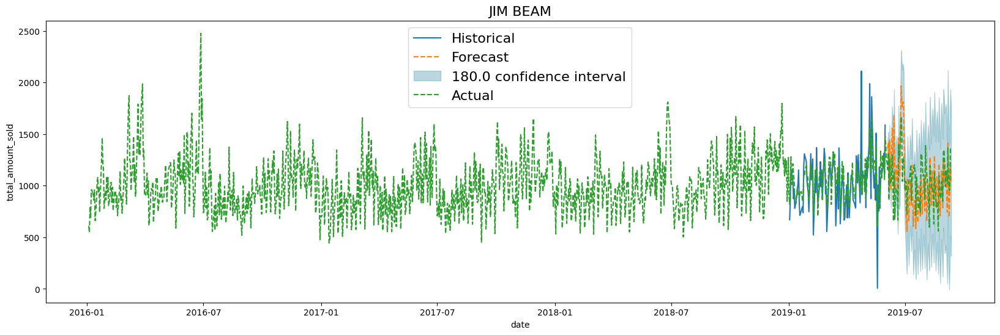

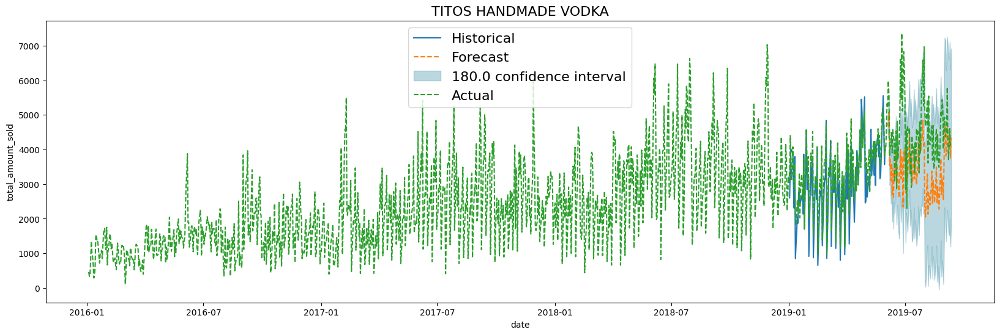

In [191]:
itemslist = list(dfforcast_result.item_name.unique())

for item in itemslist:
    datah = dfhistorical[dfhistorical.item_name==item].sort_values('date')
    dataf = new_for[new_for.item_name==item].sort_values(['forecast_timestamp'])
    dataa = dfactual_full[dfactual_full.item_name==item].sort_values('date')
    plot_historical_and_forecast(input_timeseries = datah, 
                             timestamp_col_name = "date", 
                             data_col_name = "total_amount_sold", 
                             forecast_output = dataf, 
                             actual = dataa,
                             title = item,
                             plotstartdate = "2019-01-01")

## Compare original model and trend+seasonality model
Compare original model and trend+seasonality model with simple stats about `absolute value of (prediction value-actual values)`

In [192]:
new_for = new_for.reset_index()
new_for['total_amount_sold'] = new_for['forecast_value']
new_for['date']=new_for['forecast_timestamp']
new_for = new_for.set_index(['item_name','date'])
dfactual_full = dfactual_full.reset_index()
dfactual_full = dfactual_full.set_index(['item_name','date'])
stat_ts = np.absolute(dfactual_full - new_for)
stat_ts.head()

confidence_interval_lower_bound  \
item_name    date                                                         
BLACK VELVET 2016-01-04 00:00:00+00:00                              NaN   
             2016-01-05 00:00:00+00:00                              NaN   
             2016-01-06 00:00:00+00:00                              NaN   
             2016-01-07 00:00:00+00:00                              NaN   
             2016-01-08 00:00:00+00:00                              NaN   

                                        confidence_interval_upper_bound  \
item_name    date                                                         
BLACK VELVET 2016-01-04 00:00:00+00:00                              NaN   
             2016-01-05 00:00:00+00:00                              NaN   
             2016-01-06 00:00:00+00:00                              NaN   
             2016-01-07 00:00:00+00:00                              NaN   
             2016-01-08 00:00:00+00:00                              NaN   

                                        confidence_level  forecast_timestamp  \
item_name    date                                                              
BLACK VELVET 2016-01-04 00:00:00+00:00               NaN                 NaN   
             2016-01-05 00:00:00+00:00               NaN                 NaN   
             2016-01-06 00:00:00+00:00               NaN                 NaN   
             2016-01-07 00:00:00+00:00               NaN                 NaN   
             2016-01-08 00:00:00+00:00               NaN                 NaN   

                                        forecast_value  index  \
item_name    date                                               
BLACK VELVET 2016-01-04 00:00:00+00:00             NaN    NaN   
             2016-01-05 00:00:00+00:00             NaN    NaN   
             2016-01-06 00:00:00+00:00             NaN    NaN   
             2016-01-07 00:00:00+00:00             NaN    NaN   
             2016-01-08 00:00:00+00:00             NaN    NaN   

                                        prediction_interval_lower_bound  \
item_name    date                                                         
BLACK VELVET 2016-01-04 00:00:00+00:00                              NaN   
             2016-01-05 00:00:00+00:00                              NaN   
             2016-01-06 00:00:00+00:00                              NaN   
             2016-01-07 00:00:00+00:00                              NaN   
             2016-01-08 00:00:00+00:00                              NaN   

                                        prediction_interval_upper_bound  \
item_name    date                                                         
BLACK VELVET 2016-01-04 00:00:00+00:00                              NaN   
             2016-01-05 00:00:00+00:00                              NaN   
             2016-01-06 00:00:00+00:00                              NaN   
             2016-01-07 00:00:00+00:00                              NaN   
             2016-01-08 00:00:00+00:00                              NaN   

                                        seasonal  standard_error  \
item_name    date                                                  
BLACK VELVET 2016-01-04 00:00:00+00:00       NaN             NaN   
             2016-01-05 00:00:00+00:00       NaN             NaN   
             2016-01-06 00:00:00+00:00       NaN             NaN   
             2016-01-07 00:00:00+00:00       NaN             NaN   
             2016-01-08 00:00:00+00:00       NaN             NaN   

                                        total_amount_sold  
item_name    date                                          
BLACK VELVET 2016-01-04 00:00:00+00:00                NaN  
             2016-01-05 00:00:00+00:00                NaN  
             2016-01-06 00:00:00+00:00                NaN  
             2016-01-07 00:00:00+00:00                NaN  
             2016-01-08 00:00:00+00:00                NaN

In [193]:
dfforecast_plus = dfforecast_plus.reset_index()
dfforecast_plus['total_amount_sold'] = dfforecast_plus['forecast_value']
dfforecast_plus['date']=dfforecast_plus['forecast_timestamp']
dfforecast_plus = dfforecast_plus.set_index(['item_name','date'])
dfactual= dfactual.reset_index()
dfactual = dfactual.set_index(['item_name','date'])
stat_arima = np.absolute(dfactual - dfforecast_plus)

/var/tmp/ipykernel_3732/1370313626.py:7: RuntimeWarning: The values in the array are unorderable. Pass `sort=False` to suppress this warning.
  stat_arima = np.absolute(dfactual - dfforecast_plus)


In [194]:
stat_arima.head()

,,confidence_interval_lower_bound,confidence_interval_upper_bound,confidence_level,forecast_timestamp,forecast_value,index,prediction_interval_lower_bound,prediction_interval_upper_bound,standard_error,total_amount_sold
item_name,date,,,,,,,,,,
TITOS HANDMADE VODKA,2019-06-03,NaN,NaN,NaN,NaN,NaN,602.000,NaN,NaN,NaN,171.217
WOODFORD RESERVE,2019-06-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
DR MCGILLICUDDYS APPLE PIE,2019-06-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
WINDSOR CANADIAN,2019-06-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>
UV CAKE,2019-06-03,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<NA>


In [195]:
stat_ts = stat_ts.reset_index()
stat_ts[['item_name', 'total_amount_sold']].groupby('item_name').describe()

total_amount_sold                            \
                                           count     mean     std      min   
item_name                                                                    
BLACK VELVET                              99.000 1234.094 904.956    1.591   
CAPTAIN MORGAN ORIGINAL SPICED            99.000 1123.580 142.144  695.102   
FIREBALL CINNAMON WHISKEY                 99.000 3366.873 479.395 2490.586   
FIVE O'CLOCK VODKA                        99.000  236.473 203.835    7.013   
HAWKEYE VODKA                             99.000  475.966 401.338    6.436   
JIM BEAM                                  99.000  189.481 147.384    2.526   
TITOS HANDMADE VODKA                      99.000 1172.183 833.733    5.374   

                                                                    
                                    25%      50%      75%      max  
item_name                                                           
BLACK VELVET                    564.345 1033.198 1722.553 4235.841  
CAPTAIN MORGAN ORIGINAL SPICED 1049.681 1131.441 1217.726 1457.851  
FIREBALL CINNAMON WHISKEY      2984.060 3344.467 3721.357 4839.969  
FIVE O'CLOCK VODKA               89.649  170.462  311.427  935.716  
HAWKEYE VODKA                   153.262  323.818  684.631 1704.247  
JIM BEAM                         75.482  161.679  247.503  722.011  
TITOS HANDMADE VODKA            484.683 1142.480 1590.369 3551.547

In [196]:
stat_arima = stat_arima.reset_index()
stat_arima[['item_name', 'total_amount_sold']].groupby('item_name').describe()

total_amount_sold                                      \
                                  count  mean   std   min   25%   50%   75%   
item_name                                                                     
1800 ANEJO                        0.000  <NA>  <NA>  <NA>  <NA>  <NA>  <NA>   
1800 COCONUT                      0.000  <NA>  <NA>  <NA>  <NA>  <NA>  <NA>   
1800 REPOSADO                     0.000  <NA>  <NA>  <NA>  <NA>  <NA>  <NA>   
1800 SILVER                       0.000  <NA>  <NA>  <NA>  <NA>  <NA>  <NA>   
1800 SILVER MINI                  0.000  <NA>  <NA>  <NA>  <NA>  <NA>  <NA>   
...                                 ...   ...   ...   ...   ...   ...   ...   
YUKON JACK WICKED HOT             0.000  <NA>  <NA>  <NA>  <NA>  <NA>  <NA>   
ZAMBELLO RED SAMBUCA              0.000  <NA>  <NA>  <NA>  <NA>  <NA>  <NA>   
ZAYA GRAN RESERVA RUM             0.000  <NA>  <NA>  <NA>  <NA>  <NA>  <NA>   
ZIYAD WHITE RYE                   0.000  <NA>  <NA>  <NA>  <NA>  <NA>  <NA>   
ZYR VODKA                         0.000  <NA>  <NA>  <NA>  <NA>  <NA>  <NA>   

                             
                        max  
item_name                    
1800 ANEJO             <NA>  
1800 COCONUT           <NA>  
1800 REPOSADO          <NA>  
1800 SILVER            <NA>  
1800 SILVER MINI       <NA>  
...                     ...  
YUKON JACK WICKED HOT  <NA>  
ZAMBELLO RED SAMBUCA   <NA>  
ZAYA GRAN RESERVA RUM  <NA>  
ZIYAD WHITE RYE        <NA>  
ZYR VODKA              <NA>  

[2306 rows x 8 columns]

## CausalImpact

Apply `pyCausalImpact` - Python causal impact (or causal inference) implementation of [Google's model](https://github.com/google/CausalImpact) to time-series data, with trend + sseasonality data as a control data 

In [103]:
!pip3 install pyCausalImpact

In [197]:
##%%bigquery dforiginal --project $PROJECT_ID 

## Sample data: HAWKEYE VODKA - There is a change after '2019-08-01'
sql = """
SELECT 
    date,
    SUM(bottles_sold) AS total_amount_sold
FROM
    `bigquery-public-data.iowa_liquor_sales.sales` 
WHERE
    date BETWEEN '2019-01-01' AND '2019-10-01'
    AND item_description = "JIM BEAM"
GROUP BY
    date;

    """
query_job = client.query(sql)
dforiginal = query_job.to_dataframe()
dforiginal.head()

,date,total_amount_sold
0,2019-05-21,754
1,2019-08-20,788
2,2019-01-15,1023
3,2019-03-07,1122
4,2019-05-17,1510


In [200]:
## add trend+seasonalities
dfactual_full = dfactual_full.reset_index()
new_tr = dfactual_full[dfactual_full['item_name']=="JIM BEAM"][dfactual_full["date"]>='2019-01-01'][dfactual_full["date"]<"2019-10-02"][['date', 'total_amount_sold']]
new_tr['date']=new_tr['date'].dt.date
new_tr['trend_season']=new_tr['total_amount_sold']
new_tr.head()

/var/tmp/ipykernel_3732/2536848101.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  new_tr = dfactual_full[dfactual_full['item_name']=="JIM BEAM"][dfactual_full["date"]>='2019-01-01'][dfactual_full["date"]<"2019-10-02"][['date', 'total_amount_sold']]
/var/tmp/ipykernel_3732/2536848101.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  new_tr = dfactual_full[dfactual_full['item_name']=="JIM BEAM"][dfactual_full["date"]>='2019-01-01'][dfactual_full["date"]<"2019-10-02"][['date', 'total_amount_sold']]


,date,total_amount_sold,trend_season
7654,2019-01-01,900.266,900.266
7660,2019-01-02,820.177,820.177
7667,2019-01-03,1020.676,1020.676
7674,2019-01-04,1280.351,1280.351
7681,2019-01-05,1010.348,1010.348


In [199]:
dfactual_full.head()

,,index,total_amount_sold
item_name,date,,
FIVE O'CLOCK VODKA,2016-01-04 00:00:00+00:00,0,1332.639
BLACK VELVET,2016-01-04 00:00:00+00:00,1,1524.872
HAWKEYE VODKA,2016-01-04 00:00:00+00:00,2,983.452
FIREBALL CINNAMON WHISKEY,2016-01-04 00:00:00+00:00,3,2641.324
TITOS HANDMADE VODKA,2016-01-04 00:00:00+00:00,4,457.120


In [201]:
dfcomp = dforiginal.merge(new_tr[['date','trend_season']], on = 'date').sort_values('date')
dfcomp.head()

,date,total_amount_sold,trend_season
34,2019-01-02,670,820.177
173,2019-01-03,851,1020.676
18,2019-01-04,1164,1280.351
11,2019-01-07,1053,1212.050
153,2019-01-08,874,1111.661


In [202]:
dfcomp = dfcomp.reset_index()
dfcomp.head()

,index,date,total_amount_sold,trend_season
0,34,2019-01-02,670,820.177
1,173,2019-01-03,851,1020.676
2,18,2019-01-04,1164,1280.351
3,11,2019-01-07,1053,1212.050
4,153,2019-01-08,874,1111.661


In [203]:
dfcomp['total_amount_sold'] =dfcomp['total_amount_sold'].astype(int)

In [204]:
dfcomp.shape

(179, 4)

In [205]:
from causalimpact import CausalImpact

# trend+seasonality as a control group
pre_period = [0,150]
post_period = [151,177] ## 2019-08-01
impact = CausalImpact(dfcomp[['total_amount_sold','trend_season']], pre_period, post_period)

/opt/conda/lib/python3.10/site-packages/statsmodels/base/optimizer.py:19: FutureWarning: Keyword arguments have been passed to the optimizer that have no effect. The list of allowed keyword arguments for method lbfgs is: m, pgtol, factr, maxfun, epsilon, approx_grad, bounds, loglike_and_score, iprint. The list of unsupported keyword arguments passed include: standardize, nseasons. After release 0.14, this will raise.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/statsmodels/tsa/statespace/representation.py:374: FutureWarning: Unknown keyword arguments: dict_keys(['alpha']).Passing unknown keyword arguments will raise a TypeError beginning in version 0.15.
  warnings.warn(msg, FutureWarning)


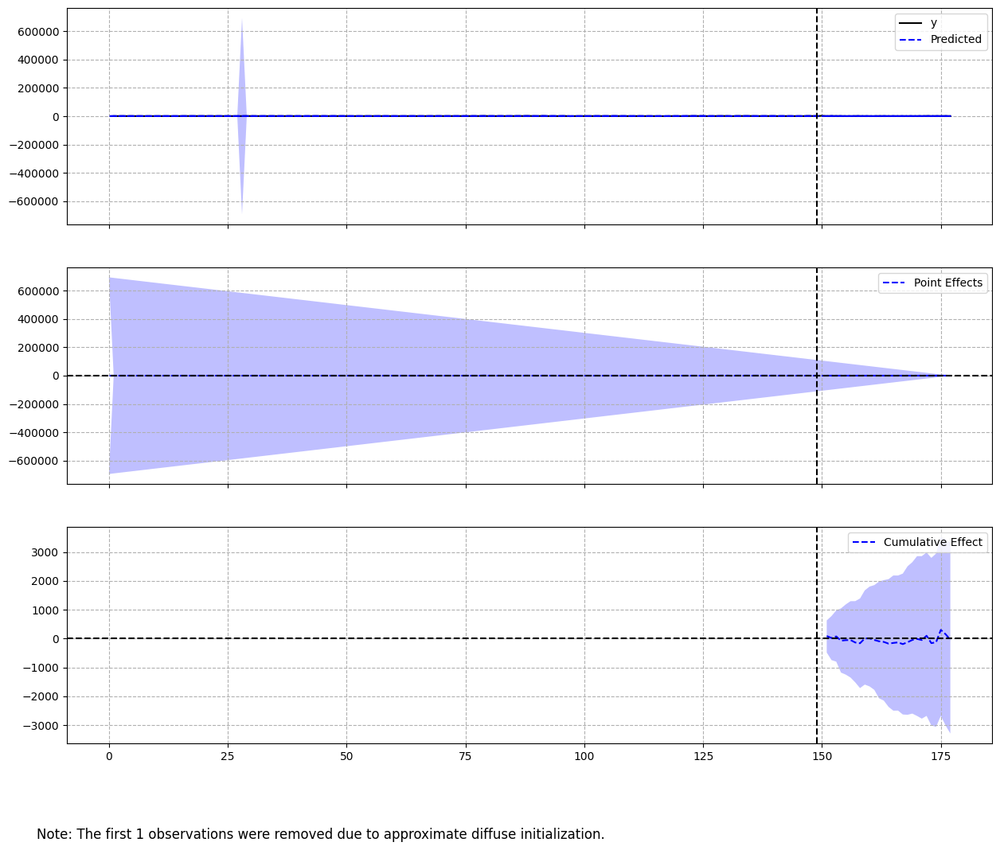

In [206]:
impact.plot()

In [207]:
print(impact.summary())

Posterior Inference {Causal Impact}
                          Average            Cumulative
Actual                    994.85             26861.0
Prediction (s.d.)         996.26 (62.42)     26898.97 (1685.31)
95% CI                    [871.89, 1116.56]  [23540.92, 30147.2]

Absolute effect (s.d.)    -1.41 (62.42)      -37.97 (1685.31)
95% CI                    [-121.71, 122.97]  [-3286.2, 3320.08]

Relative effect (s.d.)    -0.14% (6.27%)     -0.14% (6.27%)
95% CI                    [-12.22%, 12.34%]  [-12.22%, 12.34%]

Posterior tail-area probability p: 0.49
Posterior prob. of a causal effect: 50.65%

For more details run the command: print(impact.summary('report'))


## Stationary Test
### ADFuller Test 
Unit root test. If p-value is small enough, it can be stationary

In [360]:
from statsmodels.tsa.stattools import adfuller

itemslist = list(dfhistorical.item_name.unique())

for item in itemslist:
    datah = dfhistorical[dfhistorical.item_name==item]
    result = adfuller(datah['total_amount_sold'])
    print('\n' + item)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])



JIM BEAM
ADF Statistic: -9.470536
p-value: 0.000000

BLACK VELVET
ADF Statistic: -19.102148
p-value: 0.000000

HAWKEYE VODKA
ADF Statistic: -27.967665
p-value: 0.000000

FIVE O'CLOCK VODKA
ADF Statistic: -14.505927
p-value: 0.000000

TITOS HANDMADE VODKA
ADF Statistic: -21.514724
p-value: 0.000000

CAPTAIN MORGAN SPICED RUM
ADF Statistic: -29.816119
p-value: 0.000000

FIREBALL CINNAMON WHISKEY
ADF Statistic: -28.544899
p-value: 0.000000


### Autocorrelation test with plot
Autocorrelation (ACF) is a calculated value used to represent how similar a value within a time series is to a previous value. If there are some points out of the confidence interval(>0.95), it can have autocorrelation. 

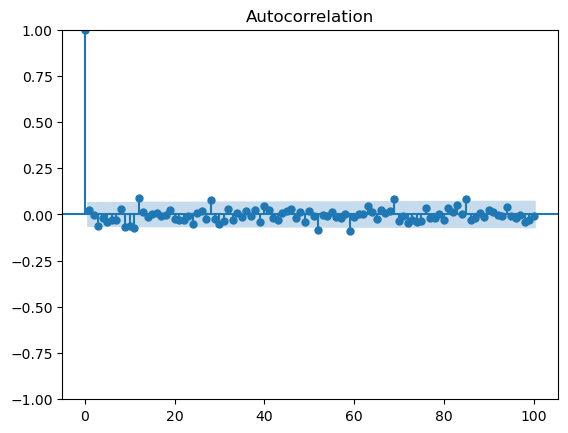

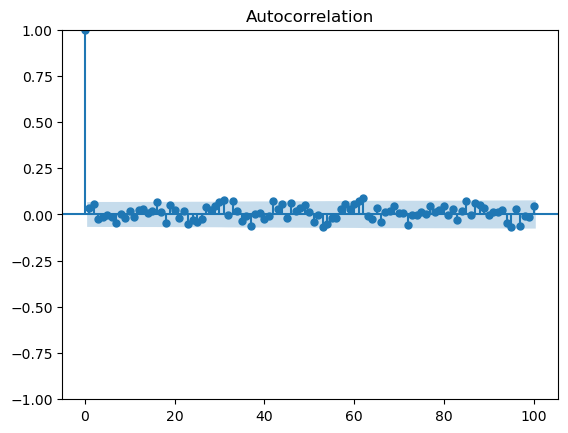

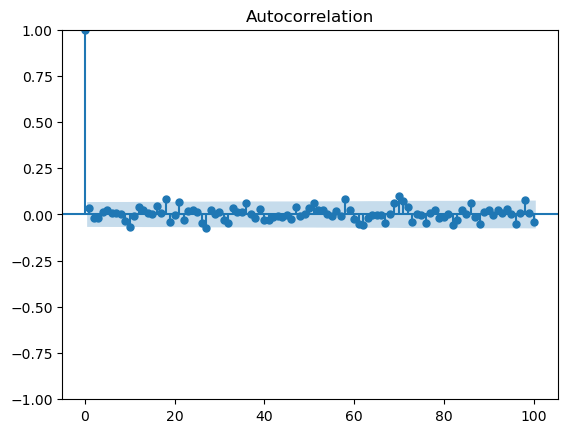

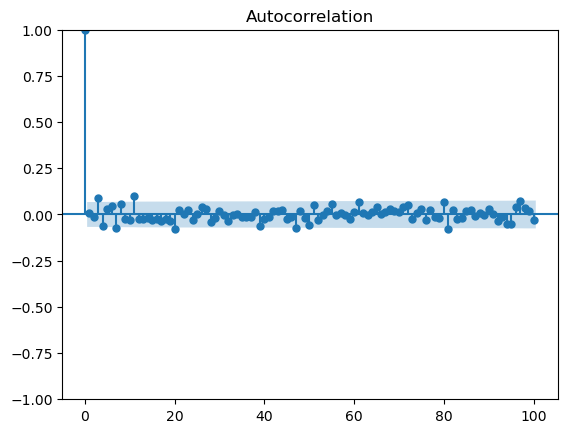

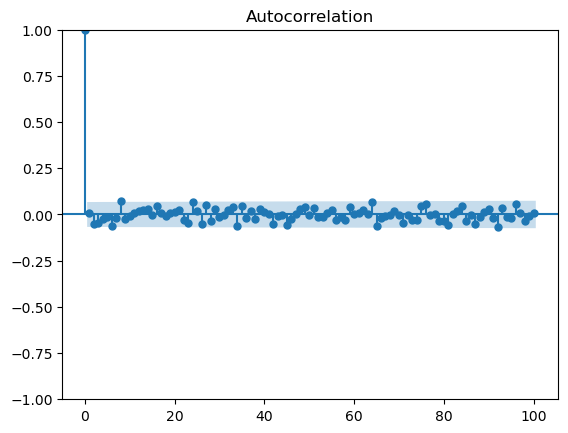

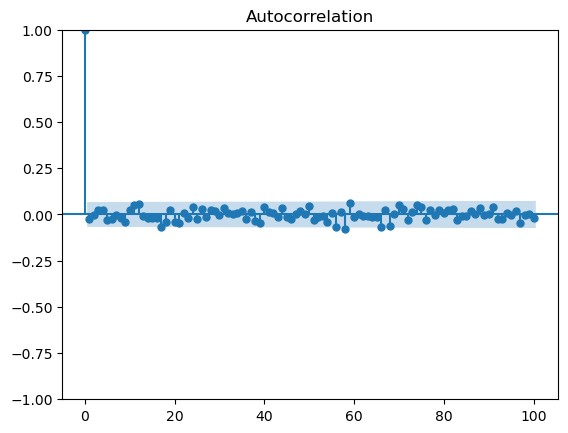

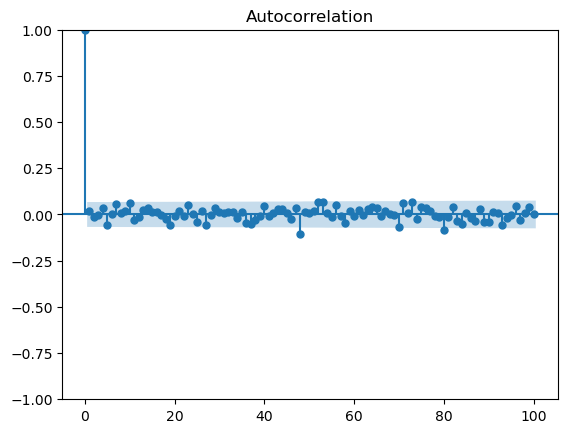

In [364]:
from statsmodels.graphics.tsaplots import plot_acf
import matplotlib.pyplot as plt

for item in itemslist:
    datah = dfhistorical[dfhistorical.item_name==item]
    plot_acf(datah['total_amount_sold'], lags=100)
    plt.show()

### Note
1. Google ML Developer Programs team supported this work by providing Google Cloud Credit.
2. This notebook is based on [Google BigQuery Example](https://github.com/GoogleCloudPlatform/analytics-componentized-patterns/blob/master/retail/time-series/bqml-demand-forecasting/bqml_retail_demand_forecasting.ipynb)